# Project 3

In this project we decided to go for a dataset that has the production of all the renewable energies in Portugal for the years 2022 and 2023 (https://transparency.entsoe.eu/dashboard/show), and we are going to forecast the production for the year 2024. 
However, since we have access to all the productions of all the renewable energies and each one of them depends on different factors/features, we decided we are just going to predict the solar aggregated power for the year of 2024.
The meteorological dataset was also collected based on the fact that we are predicting solar power (https://open-meteo.com/).

## Data Collection

In this section, we are going to import the main libraries and the previously mentioned datasets.

In [155]:
import pandas as pd
df_2022 = pd.read_csv('Actual Generation per Production Type_202201010000-202301010000.csv') #2022 RE Production (Hourly values)
df_2022.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8761 entries, 0 to 8760
Data columns (total 23 columns):
 #   Column                                                     Non-Null Count  Dtype  
---  ------                                                     --------------  -----  
 0   Area                                                       8761 non-null   object 
 1   MTU                                                        8761 non-null   object 
 2   Biomass  - Actual Aggregated [MW]                          8760 non-null   float64
 3   Fossil Brown coal/Lignite  - Actual Aggregated [MW]        8760 non-null   object 
 4   Fossil Coal-derived gas  - Actual Aggregated [MW]          8760 non-null   object 
 5   Fossil Gas  - Actual Aggregated [MW]                       8760 non-null   float64
 6   Fossil Hard coal  - Actual Aggregated [MW]                 8760 non-null   float64
 7   Fossil Oil  - Actual Aggregated [MW]                       8760 non-null   object 
 8   Fossil O

In [156]:
df_2023 = pd.read_csv('Actual Generation per Production Type_202301010000-202401010000.csv') #2023 RE Production (Hourly values)
df_2023

,Area,MTU,Biomass - Actual Aggregated [MW],Fossil Brown coal/Lignite - Actual Aggregated [MW],Fossil Coal-derived gas - Actual Aggregated [MW],Fossil Gas - Actual Aggregated [MW],Fossil Hard coal - Actual Aggregated [MW],Fossil Oil - Actual Aggregated [MW],Fossil Oil shale - Actual Aggregated [MW],Fossil Peat - Actual Aggregated [MW],...,Hydro Run-of-river and poundage - Actual Aggregated [MW],Hydro Water Reservoir - Actual Aggregated [MW],Marine - Actual Aggregated [MW],Nuclear - Actual Aggregated [MW],Other - Actual Aggregated [MW],Other renewable - Actual Aggregated [MW],Solar - Actual Aggregated [MW],Waste - Actual Aggregated [MW],Wind Offshore - Actual Aggregated [MW],Wind Onshore - Actual Aggregated [MW]
0,BZN|PT,01.01.2023 00:00 - 01.01.2023 01:00 (CET/CEST),377.0,n/e,n/e,134.0,0.0,n/e,n/e,n/e,...,1112.0,664.0,n/e,n/e,24.0,n/e,0.0,n/e,8.0,3394.0
1,BZN|PT,01.01.2023 01:00 - 01.01.2023 02:00 (CET/CEST),387.0,n/e,n/e,134.0,0.0,n/e,n/e,n/e,...,982.0,727.0,n/e,n/e,25.0,n/e,0.0,n/e,8.0,3409.0
2,BZN|PT,01.01.2023 02:00 - 01.01.2023 03:00 (CET/CEST),383.0,n/e,n/e,134.0,0.0,n/e,n/e,n/e,...,759.0,648.0,n/e,n/e,25.0,n/e,0.0,n/e,9.0,3548.0
3,BZN|PT,01.01.2023 03:00 - 01.01.2023 04:00 (CET/CEST),376.0,n/e,n/e,134.0,0.0,n/e,n/e,n/e,...,537.0,597.0,n/e,n/e,26.0,n/e,0.0,n/e,12.0,3661.0
4,BZN|PT,01.01.2023 04:00 - 01.01.2023 05:00 (CET/CEST),374.0,n/e,n/e,135.0,0.0,n/e,n/e,n/e,...,534.0,586.0,n/e,n/e,24.0,n/e,0.0,n/e,17.0,4057.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8756,BZN|PT,31.12.2023 19:00 - 31.12.2023 20:00 (CET/CEST),361.0,n/e,n/e,188.0,0.0,n/e,n/e,n/e,...,1084.0,1227.0,n/e,n/e,29.0,n/e,0.0,n/e,0.0,331.0
8757,BZN|PT,31.12.2023 20:00 - 31.12.2023 21:00 (CET/CEST),362.0,n/e,n/e,192.0,0.0,n/e,n/e,n/e,...,1386.0,1114.0,n/e,n/e,29.0,n/e,0.0,n/e,0.0,270.0
8758,BZN|PT,31.12.2023 21:00 - 31.12.2023 22:00 (CET/CEST),365.0,n/e,n/e,194.0,0.0,n/e,n/e,n/e,...,1150.0,895.0,n/e,n/e,29.0,n/e,0.0,n/e,0.0,246.0
8759,BZN|PT,31.12.2023 22:00 - 31.12.2023 23:00 (CET/CEST),363.0,n/e,n/e,196.0,0.0,n/e,n/e,n/e,...,800.0,206.0,n/e,n/e,29.0,n/e,0.0,n/e,0.0,377.0


Changing the format of the 2 files to time series and putting the data and hour as index, to simplify.

In [157]:
# Extract only the datetime part from the 'MTU' column
df_2022['MTU'] = df_2022['MTU'].str.split(' - ').str[0]

# Convert the 'MTU' column to datetime format
df_2022['MTU'] = pd.to_datetime(df_2022['MTU'], format='%d.%m.%Y %H:%M')

# Set the 'MTU' column as the index
df_2022.set_index('MTU', inplace=True)

#Changing the name to Date_Hour
df_2022.index.name = 'Date_Hour'

df_2022

,Area,Biomass - Actual Aggregated [MW],Fossil Brown coal/Lignite - Actual Aggregated [MW],Fossil Coal-derived gas - Actual Aggregated [MW],Fossil Gas - Actual Aggregated [MW],Fossil Hard coal - Actual Aggregated [MW],Fossil Oil - Actual Aggregated [MW],Fossil Oil shale - Actual Aggregated [MW],Fossil Peat - Actual Aggregated [MW],Geothermal - Actual Aggregated [MW],...,Hydro Run-of-river and poundage - Actual Aggregated [MW],Hydro Water Reservoir - Actual Aggregated [MW],Marine - Actual Aggregated [MW],Nuclear - Actual Aggregated [MW],Other - Actual Aggregated [MW],Other renewable - Actual Aggregated [MW],Solar - Actual Aggregated [MW],Waste - Actual Aggregated [MW],Wind Offshore - Actual Aggregated [MW],Wind Onshore - Actual Aggregated [MW]
Date_Hour,,,,,,,,,,,,,,,,,,,,,
2022-01-01 00:00:00,BZN|PT,417.0,n/e,n/e,496.0,0.0,n/e,n/e,n/e,n/e,...,343.0,42.0,n/e,n/e,21.0,n/e,0.0,n/e,25.0,2405.0
2022-01-01 01:00:00,BZN|PT,417.0,n/e,n/e,158.0,0.0,n/e,n/e,n/e,n/e,...,339.0,50.0,n/e,n/e,26.0,n/e,0.0,n/e,25.0,2303.0
2022-01-01 02:00:00,BZN|PT,423.0,n/e,n/e,154.0,0.0,n/e,n/e,n/e,n/e,...,195.0,51.0,n/e,n/e,28.0,n/e,0.0,n/e,25.0,2220.0
2022-01-01 03:00:00,BZN|PT,420.0,n/e,n/e,155.0,0.0,n/e,n/e,n/e,n/e,...,174.0,44.0,n/e,n/e,28.0,n/e,0.0,n/e,25.0,2146.0
2022-01-01 04:00:00,BZN|PT,418.0,n/e,n/e,155.0,0.0,n/e,n/e,n/e,n/e,...,145.0,46.0,n/e,n/e,27.0,n/e,0.0,n/e,25.0,2227.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 19:00:00,BZN|PT,388.0,n/e,n/e,394.0,0.0,n/e,n/e,n/e,n/e,...,1680.0,937.0,n/e,n/e,25.0,n/e,0.0,n/e,10.0,3863.0
2022-12-31 20:00:00,BZN|PT,383.0,n/e,n/e,421.0,0.0,n/e,n/e,n/e,n/e,...,1702.0,881.0,n/e,n/e,25.0,n/e,0.0,n/e,7.0,3807.0
2022-12-31 21:00:00,BZN|PT,376.0,n/e,n/e,343.0,0.0,n/e,n/e,n/e,n/e,...,1394.0,793.0,n/e,n/e,23.0,n/e,0.0,n/e,3.0,3697.0


In [158]:
# The same with the 2023 dataset
df_2023['MTU'] = df_2023['MTU'].str.split(' - ').str[0]
df_2023['MTU'] = pd.to_datetime(df_2023['MTU'], format='%d.%m.%Y %H:%M')
df_2023.set_index('MTU', inplace=True)
df_2023.index.name = 'Date_Hour'

df_2023

,Area,Biomass - Actual Aggregated [MW],Fossil Brown coal/Lignite - Actual Aggregated [MW],Fossil Coal-derived gas - Actual Aggregated [MW],Fossil Gas - Actual Aggregated [MW],Fossil Hard coal - Actual Aggregated [MW],Fossil Oil - Actual Aggregated [MW],Fossil Oil shale - Actual Aggregated [MW],Fossil Peat - Actual Aggregated [MW],Geothermal - Actual Aggregated [MW],...,Hydro Run-of-river and poundage - Actual Aggregated [MW],Hydro Water Reservoir - Actual Aggregated [MW],Marine - Actual Aggregated [MW],Nuclear - Actual Aggregated [MW],Other - Actual Aggregated [MW],Other renewable - Actual Aggregated [MW],Solar - Actual Aggregated [MW],Waste - Actual Aggregated [MW],Wind Offshore - Actual Aggregated [MW],Wind Onshore - Actual Aggregated [MW]
Date_Hour,,,,,,,,,,,,,,,,,,,,,
2023-01-01 00:00:00,BZN|PT,377.0,n/e,n/e,134.0,0.0,n/e,n/e,n/e,n/e,...,1112.0,664.0,n/e,n/e,24.0,n/e,0.0,n/e,8.0,3394.0
2023-01-01 01:00:00,BZN|PT,387.0,n/e,n/e,134.0,0.0,n/e,n/e,n/e,n/e,...,982.0,727.0,n/e,n/e,25.0,n/e,0.0,n/e,8.0,3409.0
2023-01-01 02:00:00,BZN|PT,383.0,n/e,n/e,134.0,0.0,n/e,n/e,n/e,n/e,...,759.0,648.0,n/e,n/e,25.0,n/e,0.0,n/e,9.0,3548.0
2023-01-01 03:00:00,BZN|PT,376.0,n/e,n/e,134.0,0.0,n/e,n/e,n/e,n/e,...,537.0,597.0,n/e,n/e,26.0,n/e,0.0,n/e,12.0,3661.0
2023-01-01 04:00:00,BZN|PT,374.0,n/e,n/e,135.0,0.0,n/e,n/e,n/e,n/e,...,534.0,586.0,n/e,n/e,24.0,n/e,0.0,n/e,17.0,4057.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,BZN|PT,361.0,n/e,n/e,188.0,0.0,n/e,n/e,n/e,n/e,...,1084.0,1227.0,n/e,n/e,29.0,n/e,0.0,n/e,0.0,331.0
2023-12-31 20:00:00,BZN|PT,362.0,n/e,n/e,192.0,0.0,n/e,n/e,n/e,n/e,...,1386.0,1114.0,n/e,n/e,29.0,n/e,0.0,n/e,0.0,270.0
2023-12-31 21:00:00,BZN|PT,365.0,n/e,n/e,194.0,0.0,n/e,n/e,n/e,n/e,...,1150.0,895.0,n/e,n/e,29.0,n/e,0.0,n/e,0.0,246.0


Dropping all the columns that are not relative to Solar Power Production and renaming the column.

In [159]:
# Drop all columns except for 'Solar - Actual Aggregated [MW]'
df_2022 = df_2022[['Solar  - Actual Aggregated [MW]']]

# Rename the column to 'Solar Power Aggregated'
df_2022.rename(columns={'Solar  - Actual Aggregated [MW]': 'Solar Power Aggregated [MW]'}, inplace=True)

# Now your DataFrame contains only the 'Solar Power Aggregated' column
df_2022

C:\Users\jguerreiro\AppData\Local\Temp\ipykernel_28404\3533706465.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2022.rename(columns={'Solar  - Actual Aggregated [MW]': 'Solar Power Aggregated [MW]'}, inplace=True)


,Solar Power Aggregated [MW]
Date_Hour,
2022-01-01 00:00:00,0.0
2022-01-01 01:00:00,0.0
2022-01-01 02:00:00,0.0
2022-01-01 03:00:00,0.0
2022-01-01 04:00:00,0.0
...,...
2022-12-31 19:00:00,0.0
2022-12-31 20:00:00,0.0
2022-12-31 21:00:00,0.0


In [160]:
# The same for the 2023 dataset
df_2023 = df_2023[['Solar  - Actual Aggregated [MW]']]
df_2023.rename(columns={'Solar  - Actual Aggregated [MW]': 'Solar Power Aggregated [MW]'}, inplace=True)
df_2023

C:\Users\jguerreiro\AppData\Local\Temp\ipykernel_28404\815073233.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023.rename(columns={'Solar  - Actual Aggregated [MW]': 'Solar Power Aggregated [MW]'}, inplace=True)


,Solar Power Aggregated [MW]
Date_Hour,
2023-01-01 00:00:00,0.0
2023-01-01 01:00:00,0.0
2023-01-01 02:00:00,0.0
2023-01-01 03:00:00,0.0
2023-01-01 04:00:00,0.0
...,...
2023-12-31 19:00:00,0.0
2023-12-31 20:00:00,0.0
2023-12-31 21:00:00,0.0


Merging the two datasets as one.

In [161]:
df_raw=pd.concat([df_2022,df_2023])
df_raw

,Solar Power Aggregated [MW]
Date_Hour,
2022-01-01 00:00:00,0.0
2022-01-01 01:00:00,0.0
2022-01-01 02:00:00,0.0
2022-01-01 03:00:00,0.0
2022-01-01 04:00:00,0.0
...,...
2023-12-31 19:00:00,0.0
2023-12-31 20:00:00,0.0
2023-12-31 21:00:00,0.0


Now we are going to handle the meteorological file.

In [162]:
df_meteo = pd.read_csv('open-meteo-38.70N9.20W4m.csv') #All meteorological data from 2022 until April 2024
df_meteo

,time,temperature_2m (°C),relative_humidity_2m (%),apparent_temperature (°C),precipitation (mm),rain (mm),cloud_cover (%),wind_speed_10m (km/h),is_day (),sunshine_duration (s),direct_radiation (W/m²),diffuse_radiation (W/m²),direct_normal_irradiance (W/m²)
0,2022-01-01 00:00,12.5,86.0,11.7,0.0,0.0,18.0,6.5,0,0.0,0.0,0.0,0.0
1,2022-01-01 01:00,11.7,89.0,10.8,0.0,0.0,29.0,6.1,0,0.0,0.0,0.0,0.0
2,2022-01-01 02:00,12.2,90.0,11.5,0.0,0.0,30.0,5.6,0,0.0,0.0,0.0,0.0
3,2022-01-01 03:00,12.1,90.0,11.3,0.0,0.0,15.0,6.7,0,0.0,0.0,0.0,0.0
4,2022-01-01 04:00,11.5,91.0,10.6,0.0,0.0,30.0,6.1,0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
19723,2024-04-01 19:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN
19724,2024-04-01 20:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN
19725,2024-04-01 21:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN
19726,2024-04-01 22:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN


In [163]:
# Convert the 'MTU' column to datetime format
df_meteo['time'] = pd.to_datetime(df_meteo['time'])

# Set the 'MTU' column as the index
df_meteo.set_index('time', inplace=True)

#Changing the name to Date_Hour
df_meteo.index.name = 'Date_Hour'

df_meteo

,temperature_2m (°C),relative_humidity_2m (%),apparent_temperature (°C),precipitation (mm),rain (mm),cloud_cover (%),wind_speed_10m (km/h),is_day (),sunshine_duration (s),direct_radiation (W/m²),diffuse_radiation (W/m²),direct_normal_irradiance (W/m²)
Date_Hour,,,,,,,,,,,,
2022-01-01 00:00:00,12.5,86.0,11.7,0.0,0.0,18.0,6.5,0,0.0,0.0,0.0,0.0
2022-01-01 01:00:00,11.7,89.0,10.8,0.0,0.0,29.0,6.1,0,0.0,0.0,0.0,0.0
2022-01-01 02:00:00,12.2,90.0,11.5,0.0,0.0,30.0,5.6,0,0.0,0.0,0.0,0.0
2022-01-01 03:00:00,12.1,90.0,11.3,0.0,0.0,15.0,6.7,0,0.0,0.0,0.0,0.0
2022-01-01 04:00:00,11.5,91.0,10.6,0.0,0.0,30.0,6.1,0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-01 19:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN
2024-04-01 20:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN
2024-04-01 21:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN


In [164]:
#Rename the columns
df_meteo = df_meteo.rename(columns={'temperature_2m (°C)':'Temperature (°C)', 
                                    'relative_humidity_2m (%)':'Relative Humidity (%)',
                                    'apparent_temperature (°C)':'Apparent Temperature (°C)',
                                    'precipitation (mm)':'Precipitation (mm)', 
                                    'rain (mm)':'Rain (mm)', 
                                    'cloud_cover (%)':'Cloud cover (%)', 
                                    'wind_speed_10m (km/h)':'Wind speed 10m (km/h)', 
                                    'is_day ()':'Day', 
                                    'sunshine_duration (s)':'Sunshine Duration (s)', 
                                    'direct_radiation (W/m²)': 'Direct Radiation (W/m²)', 
                                    'diffuse_radiation (W/m²)':'Diffuse Radiation (W/m²)', 
                                    'direct_normal_irradiance (W/m²)':'Direct Normal Irradiance (W/m²)'})
df_meteo


,Temperature (°C),Relative Humidity (%),Apparent Temperature (°C),Precipitation (mm),Rain (mm),Cloud cover (%),Wind speed 10m (km/h),Day,Sunshine Duration (s),Direct Radiation (W/m²),Diffuse Radiation (W/m²),Direct Normal Irradiance (W/m²)
Date_Hour,,,,,,,,,,,,
2022-01-01 00:00:00,12.5,86.0,11.7,0.0,0.0,18.0,6.5,0,0.0,0.0,0.0,0.0
2022-01-01 01:00:00,11.7,89.0,10.8,0.0,0.0,29.0,6.1,0,0.0,0.0,0.0,0.0
2022-01-01 02:00:00,12.2,90.0,11.5,0.0,0.0,30.0,5.6,0,0.0,0.0,0.0,0.0
2022-01-01 03:00:00,12.1,90.0,11.3,0.0,0.0,15.0,6.7,0,0.0,0.0,0.0,0.0
2022-01-01 04:00:00,11.5,91.0,10.6,0.0,0.0,30.0,6.1,0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-01 19:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN
2024-04-01 20:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN
2024-04-01 21:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN


In [165]:
#Merging the solar production with the meteorological data
df_total=pd.merge(df_raw, df_meteo, how='outer', left_index=True, right_index=True)
df_total

,Solar Power Aggregated [MW],Temperature (°C),Relative Humidity (%),Apparent Temperature (°C),Precipitation (mm),Rain (mm),Cloud cover (%),Wind speed 10m (km/h),Day,Sunshine Duration (s),Direct Radiation (W/m²),Diffuse Radiation (W/m²),Direct Normal Irradiance (W/m²)
Date_Hour,,,,,,,,,,,,,
2022-01-01 00:00:00,0.0,12.5,86.0,11.7,0.0,0.0,18.0,6.5,0,0.0,0.0,0.0,0.0
2022-01-01 01:00:00,0.0,11.7,89.0,10.8,0.0,0.0,29.0,6.1,0,0.0,0.0,0.0,0.0
2022-01-01 02:00:00,0.0,12.2,90.0,11.5,0.0,0.0,30.0,5.6,0,0.0,0.0,0.0,0.0
2022-01-01 03:00:00,0.0,12.1,90.0,11.3,0.0,0.0,15.0,6.7,0,0.0,0.0,0.0,0.0
2022-01-01 04:00:00,0.0,11.5,91.0,10.6,0.0,0.0,30.0,6.1,0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-01 19:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN
2024-04-01 20:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN
2024-04-01 21:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN


In [166]:
# Check for NaN values in columns from df_meteo
missing_values = df_total[df_raw.columns].isnull().sum()

print("Missing values from df_meteo columns:")
print(missing_values)

Missing values from df_meteo columns:
Solar Power Aggregated [MW]    2210
dtype: int64


In [167]:
df_total.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 19730 entries, 2022-01-01 00:00:00 to 2024-04-01 23:00:00
Data columns (total 13 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Solar Power Aggregated [MW]      17520 non-null  float64
 1   Temperature (°C)                 19682 non-null  float64
 2   Relative Humidity (%)            19682 non-null  float64
 3   Apparent Temperature (°C)        19682 non-null  float64
 4   Precipitation (mm)               19682 non-null  float64
 5   Rain (mm)                        19682 non-null  float64
 6   Cloud cover (%)                  19682 non-null  float64
 7   Wind speed 10m (km/h)            19682 non-null  float64
 8   Day                              19730 non-null  int64  
 9   Sunshine Duration (s)            19682 non-null  float64
 10  Direct Radiation (W/m²)          19682 non-null  float64
 11  Diffuse Radiation (W/m²)         19682 non-nu

In [168]:
#Split the dataset in two: 2022+2023 and 2024
test_cutoff_date='2024-01-01'

df_data = df_total.loc[df_total.index < test_cutoff_date] #2022 and 2023
df_2024 = df_total.loc[df_total.index >= test_cutoff_date] #2024

df_data

,Solar Power Aggregated [MW],Temperature (°C),Relative Humidity (%),Apparent Temperature (°C),Precipitation (mm),Rain (mm),Cloud cover (%),Wind speed 10m (km/h),Day,Sunshine Duration (s),Direct Radiation (W/m²),Diffuse Radiation (W/m²),Direct Normal Irradiance (W/m²)
Date_Hour,,,,,,,,,,,,,
2022-01-01 00:00:00,0.0,12.5,86.0,11.7,0.0,0.0,18.0,6.5,0,0.0,0.0,0.0,0.0
2022-01-01 01:00:00,0.0,11.7,89.0,10.8,0.0,0.0,29.0,6.1,0,0.0,0.0,0.0,0.0
2022-01-01 02:00:00,0.0,12.2,90.0,11.5,0.0,0.0,30.0,5.6,0,0.0,0.0,0.0,0.0
2022-01-01 03:00:00,0.0,12.1,90.0,11.3,0.0,0.0,15.0,6.7,0,0.0,0.0,0.0,0.0
2022-01-01 04:00:00,0.0,11.5,91.0,10.6,0.0,0.0,30.0,6.1,0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,0.0,12.6,95.0,12.9,0.0,0.0,48.0,2.3,0,0.0,0.0,0.0,0.0
2023-12-31 20:00:00,0.0,11.1,97.0,10.7,0.0,0.0,44.0,4.6,0,0.0,0.0,0.0,0.0
2023-12-31 21:00:00,0.0,9.6,97.0,8.4,0.0,0.0,31.0,6.6,0,0.0,0.0,0.0,0.0


In [169]:
df_2024

,Solar Power Aggregated [MW],Temperature (°C),Relative Humidity (%),Apparent Temperature (°C),Precipitation (mm),Rain (mm),Cloud cover (%),Wind speed 10m (km/h),Day,Sunshine Duration (s),Direct Radiation (W/m²),Diffuse Radiation (W/m²),Direct Normal Irradiance (W/m²)
Date_Hour,,,,,,,,,,,,,
2024-01-01 00:00:00,NaN,9.3,93.0,7.9,0.0,0.0,43.0,5.9,0,0.0,0.0,0.0,0.0
2024-01-01 01:00:00,NaN,10.4,89.0,9.3,0.0,0.0,27.0,5.4,0,0.0,0.0,0.0,0.0
2024-01-01 02:00:00,NaN,9.8,89.0,8.5,0.0,0.0,2.0,5.6,0,0.0,0.0,0.0,0.0
2024-01-01 03:00:00,NaN,8.9,88.0,7.3,0.0,0.0,13.0,6.3,0,0.0,0.0,0.0,0.0
2024-01-01 04:00:00,NaN,8.7,89.0,7.1,0.0,0.0,9.0,6.0,0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-01 19:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN
2024-04-01 20:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN
2024-04-01 21:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN


Cleaning the possible missing values from both datasets, with the exception of the dataset for 2024 which we want to keep the values in the column corresponding to Solar Power with the values NaN to predict.

In [170]:
df_data=df_data.dropna()
df_data

,Solar Power Aggregated [MW],Temperature (°C),Relative Humidity (%),Apparent Temperature (°C),Precipitation (mm),Rain (mm),Cloud cover (%),Wind speed 10m (km/h),Day,Sunshine Duration (s),Direct Radiation (W/m²),Diffuse Radiation (W/m²),Direct Normal Irradiance (W/m²)
Date_Hour,,,,,,,,,,,,,
2022-01-01 00:00:00,0.0,12.5,86.0,11.7,0.0,0.0,18.0,6.5,0,0.0,0.0,0.0,0.0
2022-01-01 01:00:00,0.0,11.7,89.0,10.8,0.0,0.0,29.0,6.1,0,0.0,0.0,0.0,0.0
2022-01-01 02:00:00,0.0,12.2,90.0,11.5,0.0,0.0,30.0,5.6,0,0.0,0.0,0.0,0.0
2022-01-01 03:00:00,0.0,12.1,90.0,11.3,0.0,0.0,15.0,6.7,0,0.0,0.0,0.0,0.0
2022-01-01 04:00:00,0.0,11.5,91.0,10.6,0.0,0.0,30.0,6.1,0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,0.0,12.6,95.0,12.9,0.0,0.0,48.0,2.3,0,0.0,0.0,0.0,0.0
2023-12-31 20:00:00,0.0,11.1,97.0,10.7,0.0,0.0,44.0,4.6,0,0.0,0.0,0.0,0.0
2023-12-31 21:00:00,0.0,9.6,97.0,8.4,0.0,0.0,31.0,6.6,0,0.0,0.0,0.0,0.0


In [171]:
df_2024=df_2024.dropna(subset=df_2024.columns.difference(['Solar Power Aggregated [MW]']), how='any')
df_2024

,Solar Power Aggregated [MW],Temperature (°C),Relative Humidity (%),Apparent Temperature (°C),Precipitation (mm),Rain (mm),Cloud cover (%),Wind speed 10m (km/h),Day,Sunshine Duration (s),Direct Radiation (W/m²),Diffuse Radiation (W/m²),Direct Normal Irradiance (W/m²)
Date_Hour,,,,,,,,,,,,,
2024-01-01 00:00:00,NaN,9.3,93.0,7.9,0.0,0.0,43.0,5.9,0,0.00,0.0,0.0,0.0
2024-01-01 01:00:00,NaN,10.4,89.0,9.3,0.0,0.0,27.0,5.4,0,0.00,0.0,0.0,0.0
2024-01-01 02:00:00,NaN,9.8,89.0,8.5,0.0,0.0,2.0,5.6,0,0.00,0.0,0.0,0.0
2024-01-01 03:00:00,NaN,8.9,88.0,7.3,0.0,0.0,13.0,6.3,0,0.00,0.0,0.0,0.0
2024-01-01 04:00:00,NaN,8.7,89.0,7.1,0.0,0.0,9.0,6.0,0,0.00,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-30 19:00:00,NaN,11.5,73.0,8.2,0.0,0.0,48.0,17.2,0,1064.98,16.0,23.0,124.5
2024-03-30 20:00:00,NaN,11.1,74.0,7.6,0.0,0.0,100.0,18.1,0,0.00,0.0,0.0,0.0
2024-03-30 21:00:00,NaN,10.8,80.0,7.7,0.1,0.1,92.0,16.6,0,0.00,0.0,0.0,0.0


## Data Analysis

In this section we are going to explore possible outliers, trends in the features and the possibility of adding more features.

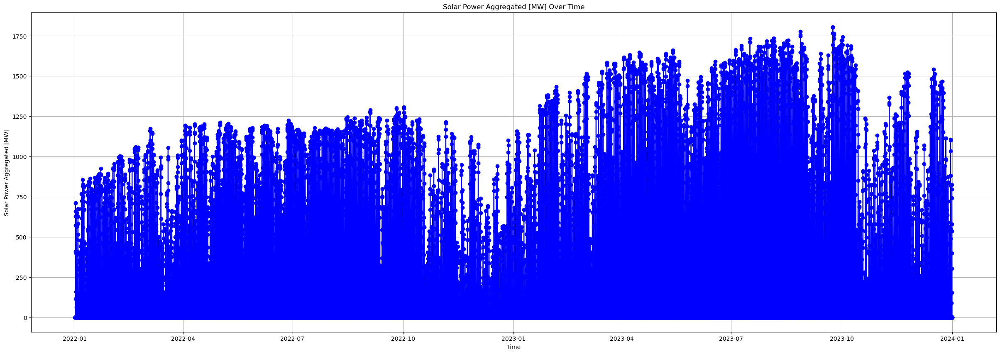

In [172]:
import matplotlib.pyplot as plt  # Importing Matplotlib library
plt.figure(figsize=(30, 10))  # Creating a figure with specific size
plt.plot(df_data.index, df_data['Solar Power Aggregated [MW]'], color='blue', marker='o', linestyle='-')  # Plotting the data
plt.title('Solar Power Aggregated [MW] Over Time')  # Setting plot title
plt.xlabel('Time')  # Setting label for x-axis
plt.ylabel('Solar Power Aggregated [MW]')  # Setting label for y-axis
plt.grid(True)  # Adding gridlines to the plot
plt.show()  # Displaying the plot


As it is possible to see we have an issue regarding the maximum aggregated power of each year, since the production was much bigger during the year of 2023 in comparison with 2022, and this is due to the fact that the installed solar capacity increased by 45%, so it is better to do a more restrict analysis to each year separately to see if the season of the year might be a potencial important feature. 

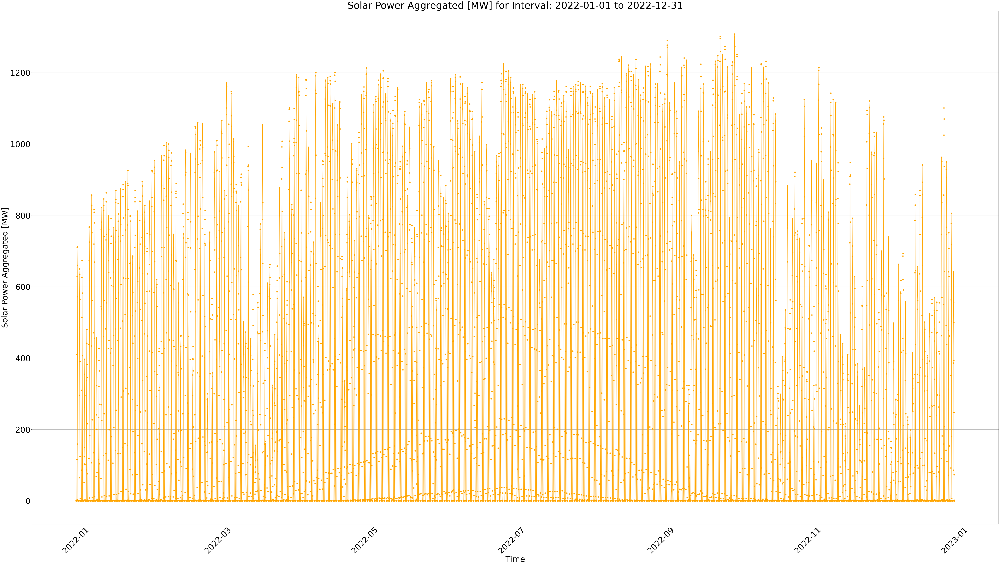

In [173]:
#2022 Solar Power plot
plt.rcParams.update({'font.size': 40})

start_date = '2022-01-01'
end_date = '2022-12-31'

interval_data = df_data.loc[start_date:end_date]

plt.figure(figsize=(70, 40))
plt.plot(interval_data.index, interval_data['Solar Power Aggregated [MW]'], color='orange', marker='o', linestyle='-')
plt.title('Solar Power Aggregated [MW] for Interval: 2022-01-01 to 2022-12-31')
plt.xlabel('Time')
plt.ylabel('Solar Power Aggregated [MW]')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

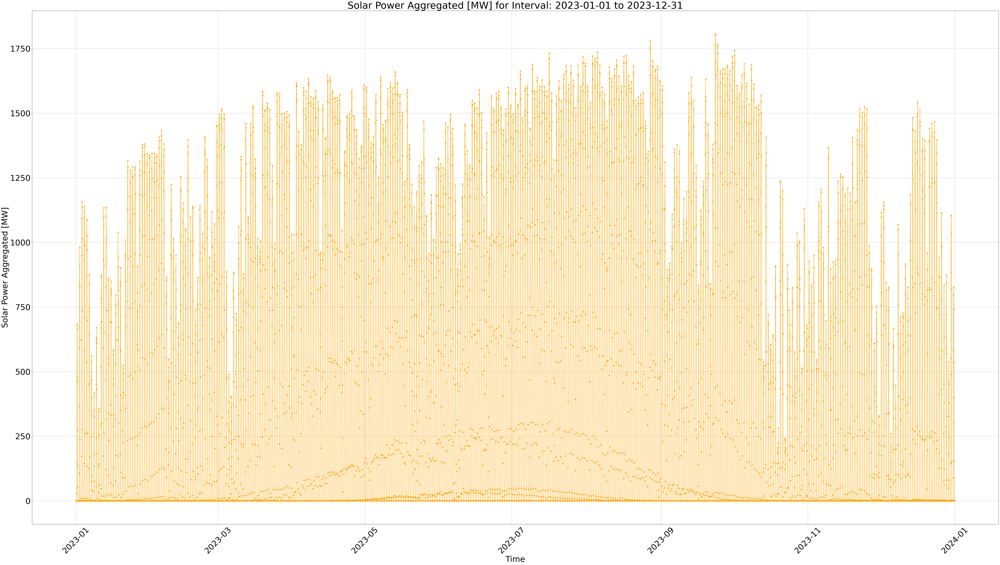

In [174]:
#2023 Solar Power plot

plt.rcParams.update({'font.size': 40})

start_date = '2023-01-01'
end_date = '2023-12-31'

interval_data = df_data.loc[start_date:end_date]

plt.figure(figsize=(70, 40))
plt.plot(interval_data.index, interval_data['Solar Power Aggregated [MW]'], color='orange', marker='o', linestyle='-')
plt.title('Solar Power Aggregated [MW] for Interval: 2023-01-01 to 2023-12-31')
plt.xlabel('Time')
plt.ylabel('Solar Power Aggregated [MW]')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

We can see there is a decrease on the production around the seasons of Autumn, Winter and maybe still in the Spring, so to be sure let's check the standard deviation, but only in the cases where it's sunny, because as we know PV panels don't produce anything during the night. In addition, the difference between the amount of energy produced in 2022 and 2023 is notable.

In [175]:
# Analyzing solar power data by season and class
def season(month):
    if month in [12, 1, 2]:  
        return 'Winter'
    elif month in [3, 4, 5]:  
        return 'Spring'
    elif month in [6, 7, 8]:  
        return 'Summer'
    else:  
        return 'Autumn'

# Assigning seasons to the DataFrame based on the month    
df_data['Month'] = df_data.index.month
df_data['Season'] = df_data['Month'].apply(season)

# Calculating standard deviation of solar power aggregated by season
std_by_season = df_data.groupby('Season')['Solar Power Aggregated [MW]'].std()

# Creating classes based on seasons
def classes(season):
    if season in ['Winter', 'Autumn']:
        return 'Winter + Autumn'
    else:
        return 'Spring + Summer'

# Calculating standard deviation of solar power aggregated by class
df_data['Classes'] = df_data['Season'].apply(classes)
std_by_classes = df_data.groupby('Classes')['Solar Power Aggregated [MW]'].std()

# Displaying results for standard deviation by season and class
print("Std of Solar Power Aggregated [MW] by season:")
print(std_by_season)
print("\nStd of Solar Power Aggregated [MW] by class:")
print(std_by_classes)


# Function to calculate standard deviation of solar power when it's sunny
def std_sunny(dataframe):
    filtered_data = dataframe[(dataframe['Day'] == 1)]
    std = filtered_data['Solar Power Aggregated [MW]'].std()
    return std

# Calculating standard deviation of solar power by season when it's sunny
std_season_sunny = df_data.groupby('Season').apply(std_sunny)
std_class_sunny = df_data.groupby('Classes').apply(std_sunny)

print("Std of Solar Power Aggregated [MW] by season when it's sunny:")
print(std_season_sunny)
print("\nStd of Solar Power Aggregated [MW] by class when it's sunny:")
print(std_class_sunny)

Std of Solar Power Aggregated [MW] by season:
Season
Autumn    452.107478
Spring    494.842611
Summer    546.957392
Winter    368.803300
Name: Solar Power Aggregated [MW], dtype: float64

Std of Solar Power Aggregated [MW] by class:
Classes
Spring + Summer    523.306078
Winter + Autumn    414.507110
Name: Solar Power Aggregated [MW], dtype: float64
Std of Solar Power Aggregated [MW] by season when it's sunny:
Season
Autumn    467.034893
Spring    482.427381
Summer    512.459360
Winter    388.690182
dtype: float64

Std of Solar Power Aggregated [MW] by class when it's sunny:
Classes
Spring + Summer    499.982464
Winter + Autumn    434.862998
dtype: float64


C:\Users\jguerreiro\AppData\Local\Temp\ipykernel_28404\66344662.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_data['Month'] = df_data.index.month
C:\Users\jguerreiro\AppData\Local\Temp\ipykernel_28404\66344662.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_data['Season'] = df_data['Month'].apply(season)
C:\Users\jguerreiro\AppData\Local\Temp\ipykernel_28404\66344662.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

There is a considerable standard deviation between the winter and summer which makes a lot of sense, however the standard deviation between the seasons autumn, spring and summer is not a lot, so we are going to represent a feature called "Hot Season" which reffers to the seasons autumn, spring and summer and that has the value 1, and the season corresponding to winter will have the value 0. 

In [176]:
df_data

,Solar Power Aggregated [MW],Temperature (°C),Relative Humidity (%),Apparent Temperature (°C),Precipitation (mm),Rain (mm),Cloud cover (%),Wind speed 10m (km/h),Day,Sunshine Duration (s),Direct Radiation (W/m²),Diffuse Radiation (W/m²),Direct Normal Irradiance (W/m²),Month,Season,Classes
Date_Hour,,,,,,,,,,,,,,,,
2022-01-01 00:00:00,0.0,12.5,86.0,11.7,0.0,0.0,18.0,6.5,0,0.0,0.0,0.0,0.0,1,Winter,Winter + Autumn
2022-01-01 01:00:00,0.0,11.7,89.0,10.8,0.0,0.0,29.0,6.1,0,0.0,0.0,0.0,0.0,1,Winter,Winter + Autumn
2022-01-01 02:00:00,0.0,12.2,90.0,11.5,0.0,0.0,30.0,5.6,0,0.0,0.0,0.0,0.0,1,Winter,Winter + Autumn
2022-01-01 03:00:00,0.0,12.1,90.0,11.3,0.0,0.0,15.0,6.7,0,0.0,0.0,0.0,0.0,1,Winter,Winter + Autumn
2022-01-01 04:00:00,0.0,11.5,91.0,10.6,0.0,0.0,30.0,6.1,0,0.0,0.0,0.0,0.0,1,Winter,Winter + Autumn
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,0.0,12.6,95.0,12.9,0.0,0.0,48.0,2.3,0,0.0,0.0,0.0,0.0,12,Winter,Winter + Autumn
2023-12-31 20:00:00,0.0,11.1,97.0,10.7,0.0,0.0,44.0,4.6,0,0.0,0.0,0.0,0.0,12,Winter,Winter + Autumn
2023-12-31 21:00:00,0.0,9.6,97.0,8.4,0.0,0.0,31.0,6.6,0,0.0,0.0,0.0,0.0,12,Winter,Winter + Autumn


In [177]:
# Remove 'Season' and 'Classes' columns from DataFrame
df_data.drop(['Season', 'Classes'], axis=1, inplace=True)

# Define function to categorize months into hot and cold seasons
def season(month):
    if month in [12, 1, 2]:  
        return 0
    elif month in [3, 4, 5]:  
        return 1
    elif month in [6, 7, 8]:  
        return 1
    else:  
        return 1

# Apply season function to create 'Hot Seasons' column    
df_data['Hot Seasons'] = df_data['Month'].apply(season)
df_data

C:\Users\jguerreiro\AppData\Local\Temp\ipykernel_28404\382062234.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_data.drop(['Season', 'Classes'], axis=1, inplace=True)
C:\Users\jguerreiro\AppData\Local\Temp\ipykernel_28404\382062234.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_data['Hot Seasons'] = df_data['Month'].apply(season)


,Solar Power Aggregated [MW],Temperature (°C),Relative Humidity (%),Apparent Temperature (°C),Precipitation (mm),Rain (mm),Cloud cover (%),Wind speed 10m (km/h),Day,Sunshine Duration (s),Direct Radiation (W/m²),Diffuse Radiation (W/m²),Direct Normal Irradiance (W/m²),Month,Hot Seasons
Date_Hour,,,,,,,,,,,,,,,
2022-01-01 00:00:00,0.0,12.5,86.0,11.7,0.0,0.0,18.0,6.5,0,0.0,0.0,0.0,0.0,1,0
2022-01-01 01:00:00,0.0,11.7,89.0,10.8,0.0,0.0,29.0,6.1,0,0.0,0.0,0.0,0.0,1,0
2022-01-01 02:00:00,0.0,12.2,90.0,11.5,0.0,0.0,30.0,5.6,0,0.0,0.0,0.0,0.0,1,0
2022-01-01 03:00:00,0.0,12.1,90.0,11.3,0.0,0.0,15.0,6.7,0,0.0,0.0,0.0,0.0,1,0
2022-01-01 04:00:00,0.0,11.5,91.0,10.6,0.0,0.0,30.0,6.1,0,0.0,0.0,0.0,0.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,0.0,12.6,95.0,12.9,0.0,0.0,48.0,2.3,0,0.0,0.0,0.0,0.0,12,0
2023-12-31 20:00:00,0.0,11.1,97.0,10.7,0.0,0.0,44.0,4.6,0,0.0,0.0,0.0,0.0,12,0
2023-12-31 21:00:00,0.0,9.6,97.0,8.4,0.0,0.0,31.0,6.6,0,0.0,0.0,0.0,0.0,12,0


### Analysis of the continuous variables

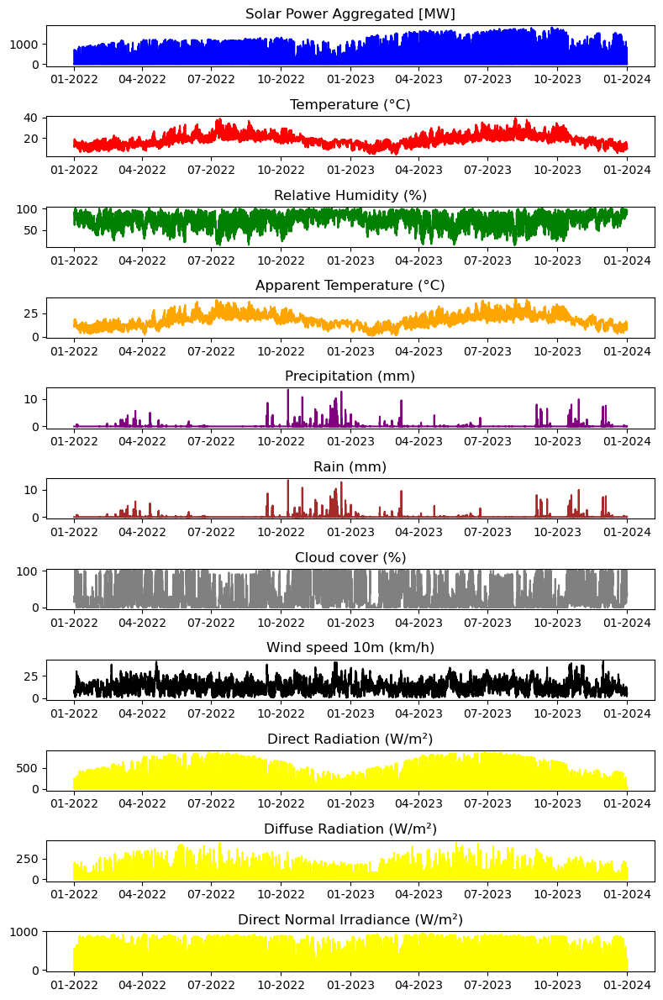

In [178]:
import matplotlib.dates as mdates
plt.rcParams.update({'font.size': 10})
fig, axs = plt.subplots(nrows=11, ncols=1, figsize=(8,12))

axs[0].plot(df_data.index, df_data['Solar Power Aggregated [MW]'], color='blue')
axs[0].set_title('Solar Power Aggregated [MW]')

axs[1].plot(df_data.index, df_data['Temperature (°C)'], color='red')
axs[1].set_title('Temperature (°C)')

axs[2].plot(df_data.index, df_data['Relative Humidity (%)'], color='green')
axs[2].set_title('Relative Humidity (%)')

axs[3].plot(df_data.index, df_data['Apparent Temperature (°C)'], color='orange')
axs[3].set_title('Apparent Temperature (°C)')

axs[4].plot(df_data.index, df_data['Precipitation (mm)'], color='purple')
axs[4].set_title('Precipitation (mm)')

axs[5].plot(df_data.index, df_data['Rain (mm)'], color='brown')
axs[5].set_title('Rain (mm)')

axs[6].plot(df_data.index, df_data['Cloud cover (%)'], color='grey')
axs[6].set_title('Cloud cover (%)')

axs[7].plot(df_data.index, df_data['Wind speed 10m (km/h)'], color='black')
axs[7].set_title('Wind speed 10m (km/h)')

axs[8].plot(df_data.index, df_data['Direct Radiation (W/m²)'], color='yellow')
axs[8].set_title('Direct Radiation (W/m²)')

axs[9].plot(df_data.index, df_data['Diffuse Radiation (W/m²)'], color='yellow')
axs[9].set_title('Diffuse Radiation (W/m²)')

axs[10].plot(df_data.index, df_data['Direct Normal Irradiance (W/m²)'], color='yellow')
axs[10].set_title('Direct Normal Irradiance (W/m²)')

for ax in axs.flat:
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%Y'))

plt.tight_layout()
plt.show()

By observation of the most important variables it seems there are no outliers and no data is missing, since the raise of the solar power for the next year it was already explained. Even so, let's check anyways.

{'whiskers': [<matplotlib.lines.Line2D at 0x1a75baa86d0>,
 'caps': [<matplotlib.lines.Line2D at 0x1a75babf710>,
 'boxes': [<matplotlib.lines.Line2D at 0x1a75baa5610>],
 'medians': [<matplotlib.lines.Line2D at 0x1a75bae06d0>],
 'fliers': [<matplotlib.lines.Line2D at 0x1a75bae0f10>],
 'means': []}

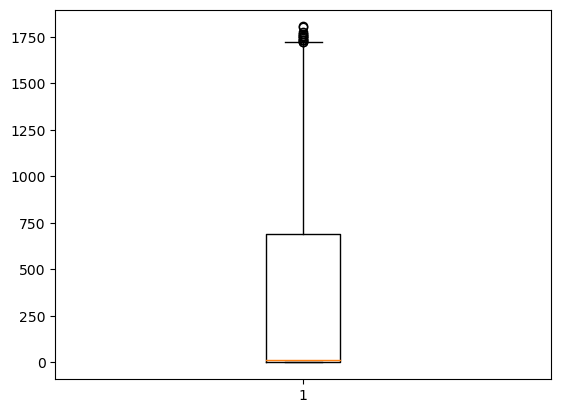

In [179]:
plt.boxplot(df_data['Solar Power Aggregated [MW]'])

{'whiskers': [<matplotlib.lines.Line2D at 0x1a7674735d0>,
 'caps': [<matplotlib.lines.Line2D at 0x1a7674809d0>,
 'boxes': [<matplotlib.lines.Line2D at 0x1a767472cd0>],
 'medians': [<matplotlib.lines.Line2D at 0x1a7674819d0>],
 'fliers': [<matplotlib.lines.Line2D at 0x1a767473e90>],
 'means': []}

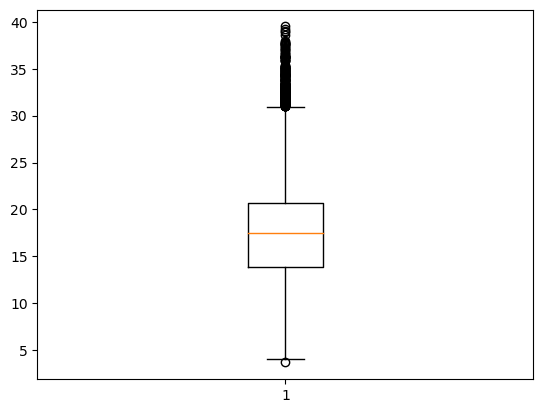

In [180]:
plt.boxplot(df_data['Temperature (°C)'])

We are not going to consider any outliers.

## Feature Selection

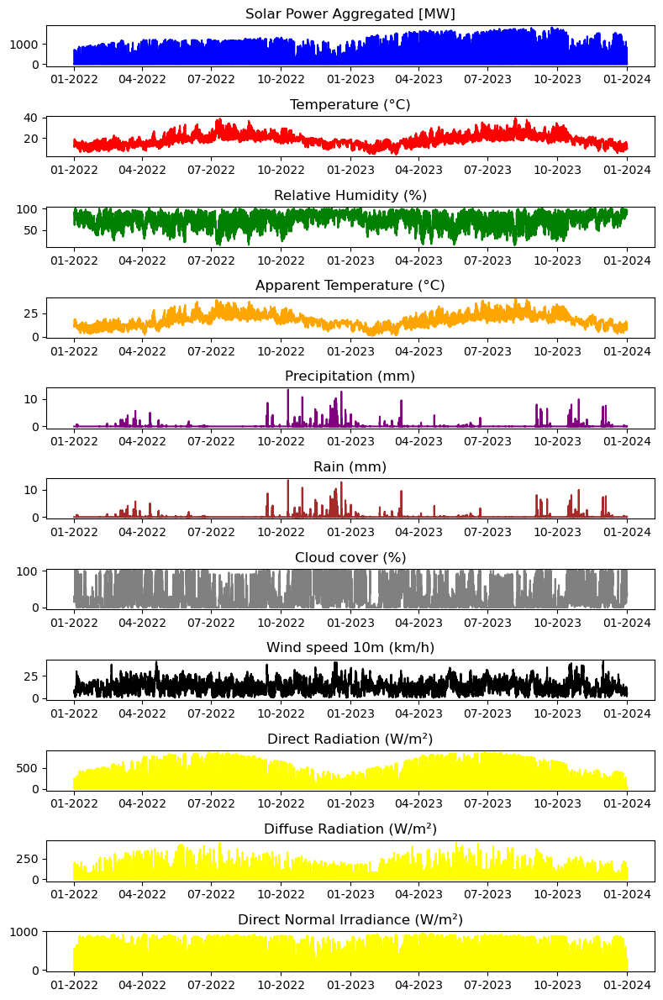

In [181]:
fig, axs = plt.subplots(nrows=11, ncols=1, figsize=(8,12))

axs[0].plot(df_data.index, df_data['Solar Power Aggregated [MW]'], color='blue')
axs[0].set_title('Solar Power Aggregated [MW]')

axs[1].plot(df_data.index, df_data['Temperature (°C)'], color='red')
axs[1].set_title('Temperature (°C)')

axs[2].plot(df_data.index, df_data['Relative Humidity (%)'], color='green')
axs[2].set_title('Relative Humidity (%)')

axs[3].plot(df_data.index, df_data['Apparent Temperature (°C)'], color='orange')
axs[3].set_title('Apparent Temperature (°C)')

axs[4].plot(df_data.index, df_data['Precipitation (mm)'], color='purple')
axs[4].set_title('Precipitation (mm)')

axs[5].plot(df_data.index, df_data['Rain (mm)'], color='brown')
axs[5].set_title('Rain (mm)')

axs[6].plot(df_data.index, df_data['Cloud cover (%)'], color='grey')
axs[6].set_title('Cloud cover (%)')

axs[7].plot(df_data.index, df_data['Wind speed 10m (km/h)'], color='black')
axs[7].set_title('Wind speed 10m (km/h)')

axs[8].plot(df_data.index, df_data['Direct Radiation (W/m²)'], color='yellow')
axs[8].set_title('Direct Radiation (W/m²)')

axs[9].plot(df_data.index, df_data['Diffuse Radiation (W/m²)'], color='yellow')
axs[9].set_title('Diffuse Radiation (W/m²)')

axs[10].plot(df_data.index, df_data['Direct Normal Irradiance (W/m²)'], color='yellow')
axs[10].set_title('Direct Normal Irradiance (W/m²)')

for ax in axs.flat:
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%Y'))

plt.tight_layout()
plt.show()

Although the values referring to rain and precipitation have a lot of nulls values we are not going to despise them since they can be useful in the context of solar power forecast.

Another thing that is possible to check is that values for Solar Power are highly dependent on previous values so 2 other features are going to be added based on the values of the previous hours: Solar Power -1h and Solar Power -2h. We are also going to add the feature hour since it can also be important in this context.

In [182]:
df_data['Solar Power-1h']=df_data['Solar Power Aggregated [MW]'].shift(1) # Previous hour production
df_data['Solar Power-2h']=df_data['Solar Power-1h'].shift(1) # Second previous hour production
df_data['Hour'] = df_data.index.hour
df_data

C:\Users\jguerreiro\AppData\Local\Temp\ipykernel_28404\676005940.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_data['Solar Power-1h']=df_data['Solar Power Aggregated [MW]'].shift(1) # Previous hour production
C:\Users\jguerreiro\AppData\Local\Temp\ipykernel_28404\676005940.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_data['Solar Power-2h']=df_data['Solar Power-1h'].shift(1) # Second previous hour production
C:\Users\jguerreiro\AppData\Local\Temp\ipykernel_28404\676005940.py:3: SettingWith

,Solar Power Aggregated [MW],Temperature (°C),Relative Humidity (%),Apparent Temperature (°C),Precipitation (mm),Rain (mm),Cloud cover (%),Wind speed 10m (km/h),Day,Sunshine Duration (s),Direct Radiation (W/m²),Diffuse Radiation (W/m²),Direct Normal Irradiance (W/m²),Month,Hot Seasons,Solar Power-1h,Solar Power-2h,Hour
Date_Hour,,,,,,,,,,,,,,,,,,
2022-01-01 00:00:00,0.0,12.5,86.0,11.7,0.0,0.0,18.0,6.5,0,0.0,0.0,0.0,0.0,1,0,NaN,NaN,0
2022-01-01 01:00:00,0.0,11.7,89.0,10.8,0.0,0.0,29.0,6.1,0,0.0,0.0,0.0,0.0,1,0,0.0,NaN,1
2022-01-01 02:00:00,0.0,12.2,90.0,11.5,0.0,0.0,30.0,5.6,0,0.0,0.0,0.0,0.0,1,0,0.0,0.0,2
2022-01-01 03:00:00,0.0,12.1,90.0,11.3,0.0,0.0,15.0,6.7,0,0.0,0.0,0.0,0.0,1,0,0.0,0.0,3
2022-01-01 04:00:00,0.0,11.5,91.0,10.6,0.0,0.0,30.0,6.1,0,0.0,0.0,0.0,0.0,1,0,0.0,0.0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,0.0,12.6,95.0,12.9,0.0,0.0,48.0,2.3,0,0.0,0.0,0.0,0.0,12,0,4.0,154.0,19
2023-12-31 20:00:00,0.0,11.1,97.0,10.7,0.0,0.0,44.0,4.6,0,0.0,0.0,0.0,0.0,12,0,0.0,4.0,20
2023-12-31 21:00:00,0.0,9.6,97.0,8.4,0.0,0.0,31.0,6.6,0,0.0,0.0,0.0,0.0,12,0,0.0,0.0,21


In [183]:
#since there are no values on the first 2 rows for the features these rows are going to be eliminated
df_data=df_data.dropna()
df_data

,Solar Power Aggregated [MW],Temperature (°C),Relative Humidity (%),Apparent Temperature (°C),Precipitation (mm),Rain (mm),Cloud cover (%),Wind speed 10m (km/h),Day,Sunshine Duration (s),Direct Radiation (W/m²),Diffuse Radiation (W/m²),Direct Normal Irradiance (W/m²),Month,Hot Seasons,Solar Power-1h,Solar Power-2h,Hour
Date_Hour,,,,,,,,,,,,,,,,,,
2022-01-01 02:00:00,0.0,12.2,90.0,11.5,0.0,0.0,30.0,5.6,0,0.0,0.0,0.0,0.0,1,0,0.0,0.0,2
2022-01-01 03:00:00,0.0,12.1,90.0,11.3,0.0,0.0,15.0,6.7,0,0.0,0.0,0.0,0.0,1,0,0.0,0.0,3
2022-01-01 04:00:00,0.0,11.5,91.0,10.6,0.0,0.0,30.0,6.1,0,0.0,0.0,0.0,0.0,1,0,0.0,0.0,4
2022-01-01 05:00:00,0.0,11.4,91.0,10.5,0.0,0.0,29.0,5.9,0,0.0,0.0,0.0,0.0,1,0,0.0,0.0,5
2022-01-01 06:00:00,0.0,11.6,91.0,10.7,0.0,0.0,28.0,6.9,0,0.0,0.0,0.0,0.0,1,0,0.0,0.0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,0.0,12.6,95.0,12.9,0.0,0.0,48.0,2.3,0,0.0,0.0,0.0,0.0,12,0,4.0,154.0,19
2023-12-31 20:00:00,0.0,11.1,97.0,10.7,0.0,0.0,44.0,4.6,0,0.0,0.0,0.0,0.0,12,0,0.0,4.0,20
2023-12-31 21:00:00,0.0,9.6,97.0,8.4,0.0,0.0,31.0,6.6,0,0.0,0.0,0.0,0.0,12,0,0.0,0.0,21


In [184]:
#taking out some columns that do not seem interesting or do have a high correlation with others variables already there.
df_data = df_data.drop(columns=['Apparent Temperature (°C)', 'Precipitation (mm)', 'Day', 'Sunshine Duration (s)', 'Diffuse Radiation (W/m²)','Direct Normal Irradiance (W/m²)',])
df_data

,Solar Power Aggregated [MW],Temperature (°C),Relative Humidity (%),Rain (mm),Cloud cover (%),Wind speed 10m (km/h),Direct Radiation (W/m²),Month,Hot Seasons,Solar Power-1h,Solar Power-2h,Hour
Date_Hour,,,,,,,,,,,,
2022-01-01 02:00:00,0.0,12.2,90.0,0.0,30.0,5.6,0.0,1,0,0.0,0.0,2
2022-01-01 03:00:00,0.0,12.1,90.0,0.0,15.0,6.7,0.0,1,0,0.0,0.0,3
2022-01-01 04:00:00,0.0,11.5,91.0,0.0,30.0,6.1,0.0,1,0,0.0,0.0,4
2022-01-01 05:00:00,0.0,11.4,91.0,0.0,29.0,5.9,0.0,1,0,0.0,0.0,5
2022-01-01 06:00:00,0.0,11.6,91.0,0.0,28.0,6.9,0.0,1,0,0.0,0.0,6
...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 19:00:00,0.0,12.6,95.0,0.0,48.0,2.3,0.0,12,0,4.0,154.0,19
2023-12-31 20:00:00,0.0,11.1,97.0,0.0,44.0,4.6,0.0,12,0,0.0,4.0,20
2023-12-31 21:00:00,0.0,9.6,97.0,0.0,31.0,6.6,0.0,12,0,0.0,0.0,21


In [185]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 17518 entries, 2022-01-01 02:00:00 to 2023-12-31 23:00:00
Data columns (total 12 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Solar Power Aggregated [MW]  17518 non-null  float64
 1   Temperature (°C)             17518 non-null  float64
 2   Relative Humidity (%)        17518 non-null  float64
 3   Rain (mm)                    17518 non-null  float64
 4   Cloud cover (%)              17518 non-null  float64
 5   Wind speed 10m (km/h)        17518 non-null  float64
 6   Direct Radiation (W/m²)      17518 non-null  float64
 7   Month                        17518 non-null  int32  
 8   Hot Seasons                  17518 non-null  int64  
 9   Solar Power-1h               17518 non-null  float64
 10  Solar Power-2h               17518 non-null  float64
 11  Hour                         17518 non-null  int32  
dtypes: float64(9), int32(2), int64(1)
memor

Since 'Solar Power Aggregated [MW]' is what we are predicting, this is called Y and it is the output. The other features are called the inputs, X; and Z is the overall dataset.

In [186]:
import numpy as np
df_data.info()
# Load the data
Z = df_data.values
Y = Z[:,0]
X = Z[:,[1,2,3,4,5,6,7,8,9,10,11]]


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 17518 entries, 2022-01-01 02:00:00 to 2023-12-31 23:00:00
Data columns (total 12 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Solar Power Aggregated [MW]  17518 non-null  float64
 1   Temperature (°C)             17518 non-null  float64
 2   Relative Humidity (%)        17518 non-null  float64
 3   Rain (mm)                    17518 non-null  float64
 4   Cloud cover (%)              17518 non-null  float64
 5   Wind speed 10m (km/h)        17518 non-null  float64
 6   Direct Radiation (W/m²)      17518 non-null  float64
 7   Month                        17518 non-null  int32  
 8   Hot Seasons                  17518 non-null  int64  
 9   Solar Power-1h               17518 non-null  float64
 10  Solar Power-2h               17518 non-null  float64
 11  Hour                         17518 non-null  int32  
dtypes: float64(9), int32(2), int64(1)
memor

### Filter methods: kBest

Three different methods to help us choose the best features will be put into practice

[8.78258346e+03 1.70204182e+04 3.36543524e+01 4.44840242e+02
 3.28987095e+02 6.63478831e+04 4.71192902e+00 3.52319423e+02
 1.50561835e+05 3.21872360e+04 1.05021477e+03]
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 ...
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]


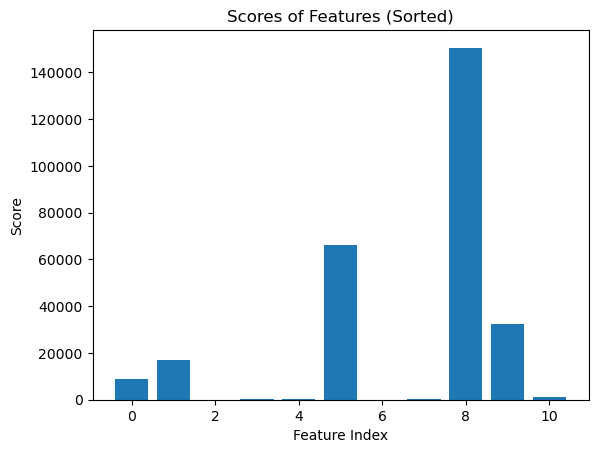

Feature 8: Score = 150561.83
Feature 5: Score = 66347.88
Feature 9: Score = 32187.24
Feature 1: Score = 17020.42
Feature 0: Score = 8782.58
Feature 10: Score = 1050.21
Feature 3: Score = 444.84
Feature 7: Score = 352.32
Feature 4: Score = 328.99
Feature 2: Score = 33.65
Feature 6: Score = 4.71


In [187]:
from sklearn.feature_selection import SelectKBest 
from sklearn.feature_selection import mutual_info_regression,f_regression 
features=SelectKBest(k=3,score_func=f_regression)  # Test different k number of features, uses f-test ANOVA

fit=features.fit(X,Y) #calculates the scores using the score_function f_regression of the features
print(fit.scores_)
features_results=fit.transform(X)
print(features_results)
sorted_indices = sorted(range(len(fit.scores_)), key=lambda i: fit.scores_[i], reverse=True)
sorted_scores = [fit.scores_[i] for i in sorted_indices]

plt.bar(range(len(fit.scores_)), fit.scores_)

plt.xlabel('Feature Index')
plt.ylabel('Score')
plt.title('Scores of Features (Sorted)')
plt.show()

# Print the scores for each feature in descending order
for i, score in zip(sorted_indices, sorted_scores):
    print(f"Feature {i}: Score = {score:.2f}")


The higher the score, the better the feature, so the best features accordingly to this method are: Solar Power-1h, Direct Radiation and Solar Power-2h

### RFE

In [188]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
model=LinearRegression() # LinearRegression Model as Estimator
rfe1=RFE(model,n_features_to_select=1)# using 1 features
rfe2=RFE(model,n_features_to_select=2) # using 2 features
rfe3=RFE(model,n_features_to_select=3)# using 3 features
rfe4=RFE(model,n_features_to_select=4)# using 4 features
rfe5=RFE(model,n_features_to_select=5)# using 5 features
fit1=rfe1.fit(X,Y)
fit2=rfe2.fit(X,Y)
fit3=rfe3.fit(X,Y)
fit4=rfe4.fit(X,Y)
fit5=rfe5.fit(X,Y)

In [189]:
print( "Feature Ranking (Linear Model, 1 features): %s" % (fit1.ranking_)) #Hot Seasons
print( "Feature Ranking (Linear Model, 2 features): %s" % (fit2.ranking_)) #Relative Humidity
print( "Feature Ranking (Linear Model, 3 features): %s" % (fit3.ranking_)) #Hour
print( "Feature Ranking (Linear Model, 4 features): %s" % (fit4.ranking_)) #Solar Power-1h
print( "Feature Ranking (Linear Model, 5 features): %s" % (fit5.ranking_)) #Solar Power-2h

Feature Ranking (Linear Model, 1 features): [ 8  2 10  9 11  7  6  1  4  5  3]
Feature Ranking (Linear Model, 2 features): [ 7  1  9  8 10  6  5  1  3  4  2]
Feature Ranking (Linear Model, 3 features): [6 1 8 7 9 5 4 1 2 3 1]
Feature Ranking (Linear Model, 4 features): [5 1 7 6 8 4 3 1 1 2 1]
Feature Ranking (Linear Model, 5 features): [4 1 6 5 7 3 2 1 1 1 1]


### RFR

In [190]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor()
model.fit(X, Y)
feature_importances = model.feature_importances_

indices = feature_importances.argsort()

print("Indices of features with the highest importances:")
print(indices)

Indices of features with the highest importances:
[ 7  2  1  4  6  0  3  9 10  5  8]


In [191]:
#Month, Temperature, Direct Radiation, Solar-1, Solar-2

In [192]:
#As we already know the best features, we are only using those ones for the regression models, the ones with better score in the 3 methods used. 

Z = df_data.values
Y = Z[:,0]
#X = Z[:,[1,2,5,6,7,8,9,10,11]]
X=Z[:,[1,2,6,9,10]]

## Regression Models

In this section various regression models will be tested.

In [193]:
from sklearn.model_selection import train_test_split
from sklearn import  metrics
import statsmodels.api as sm

### Auto Regressive Models

In [194]:
# This method trains an autoregression model using the AutoReg function from statsmodels.
# It splits the data into train and test sets, defines a window size for the lag features, and fits the autoregression model to the training data.
# Finally, it prints the summary of the trained model.
from statsmodels.tsa.ar_model import AutoReg

#Identify output Y
Y=df_data.values[:,0]

split_point = len(Y) - 1000
train, test = Y[0:split_point], Y[split_point:]
# train autoregression
window = 5
model = AutoReg(train, lags=window)
model_fit = model.fit()

print(model_fit.summary())

                            AutoReg Model Results                             
Dep. Variable:                      y   No. Observations:                16518
Model:                     AutoReg(5)   Log Likelihood              -92834.387
Method:               Conditional MLE   S.D. of innovations             66.884
Date:                Thu, 11 Apr 2024   AIC                         185682.774
Time:                        01:10:56   BIC                         185736.757
Sample:                             5   HQIC                        185700.601
                                16518                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         29.2195      0.751     38.928      0.000      27.748      30.691
y.L1           2.1731      0.008    279.248      0.000       2.158       2.188
y.L2          -1.8883      0.019   -102.026      0.0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


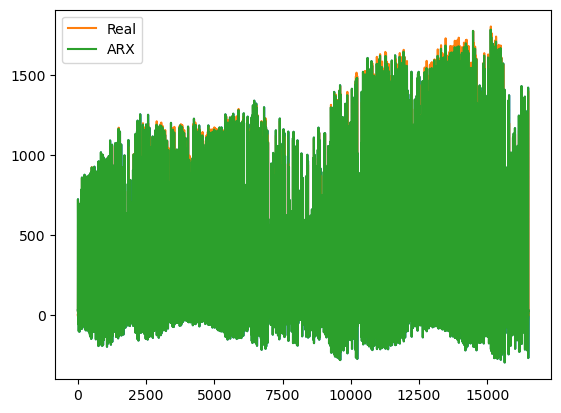

In [195]:
model_fit.plot_predict() # Predicted values from the model fit.
plt.plot(train,label='Real')
plt.plot(model_fit.fittedvalues,label='ARX')
plt.legend()

#### Testing the ARX model with test data 

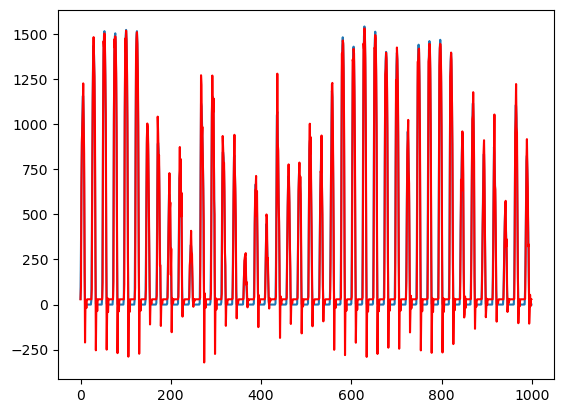

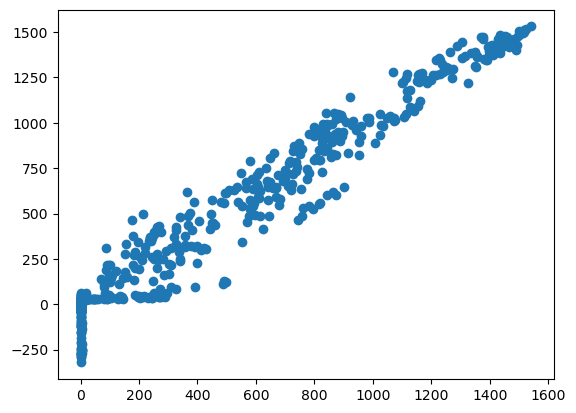

In [196]:
#This section of the code is dedicated to testing the ARX (AutoRegressive with eXogenous inputs) model using the test dataset.

from sklearn.metrics import mean_squared_error
from math import sqrt

coef = model_fit.params
history = train[len(train)-window:]
history = [history[i] for i in range(len(history))]
predictions = list()
for t in range(len(test)):
    length = len(history)
    lag = [history[i] for i in range(length-window,length)]
    yhat = coef[0]
    for d in range(window):
        yhat += coef[d+1] * lag[window-d-1]
    obs = test[t]
    predictions.append(yhat)
    history.append(obs)

plt.plot(test)
plt.plot(predictions, color='red')
plt.show()

plt.scatter(test,predictions)
plt.show()

#### Evaluating the model error


In [197]:
#Computing evaluation metrics
MAE_AR=metrics.mean_absolute_error(test,predictions) 
MBE_AR=np.mean(test-predictions) #here we calculate MBE
MSE_AR=metrics.mean_squared_error(test,predictions)  
RMSE_AR= np.sqrt(metrics.mean_squared_error(test,predictions))
cvRMSE_AR=RMSE_AR/np.mean(test)
NMBE_AR=MBE_AR/np.mean(test)
print(MAE_AR, MBE_AR,MSE_AR, RMSE_AR,cvRMSE_AR,NMBE_AR)

56.373691169110174 -7.522959936584331 6992.024837722254 83.61832836000882 0.3171637828283929 -0.028534538759024786


In [198]:
Z = df_data.values
Y = Z[:,0]
X = Z[:,[1,2,6,9,10]]
#by default, it chooses randomly 75% of the data for training and 25% for testing
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 24, shuffle = False)
print(X_train)
print(y_train)

[[12.2 90.   0.   0.   0. ]
 [12.1 90.   0.   0.   0. ]
 [11.5 91.   0.   0.   0. ]
 ...
 [13.5 95.   0.   0.   0. ]
 [12.4 94.   0.   0.   0. ]
 [11.9 93.   0.   0.   0. ]]
[0. 0. 0. ... 0. 0. 0.]


### Linear Regression

In [199]:
from sklearn import  linear_model

# Create linear regression object
regr = linear_model.LinearRegression()

# Train the model using the training sets
regr.fit(X_train,y_train)

# Make predictions using the testing set
y_pred_LR = regr.predict(X_test)

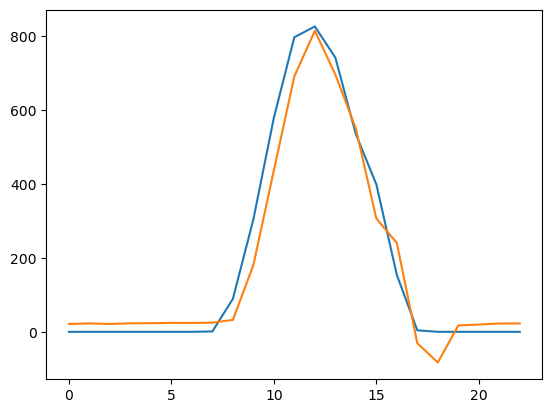

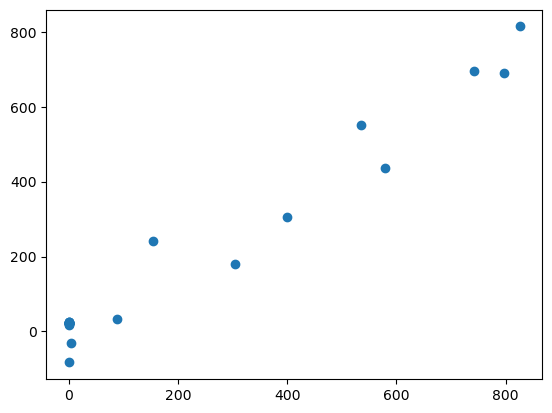

In [200]:
plt.plot(y_test[1:200])
plt.plot(y_pred_LR[1:200])
plt.show()
plt.scatter(y_test,y_pred_LR)

In [201]:
#Evaluate errors
MAE_LR=metrics.mean_absolute_error(y_test,y_pred_LR) 
MBE_LR=np.mean(y_test- y_pred_LR) 
MSE_LR=metrics.mean_squared_error(y_test,y_pred_LR)  
RMSE_LR= np.sqrt(metrics.mean_squared_error(y_test,y_pred_LR))
cvRMSE_LR=RMSE_LR/np.mean(y_test)
NMBE_LR=MBE_LR/np.mean(y_test)
print(MAE_LR, MBE_LR,MSE_LR, RMSE_LR,cvRMSE_LR,NMBE_LR)

45.284078954040076 12.794943706684961 3462.9121464804753 58.8465134607011 0.31880729640108946 0.06931797944930904


### Decision Tree Regressor

In [202]:
from sklearn.tree import DecisionTreeRegressor

DT_regr_model = DecisionTreeRegressor()
DT_regr_model.fit(X_train, y_train)
y_pred_DT = DT_regr_model.predict(X_test)

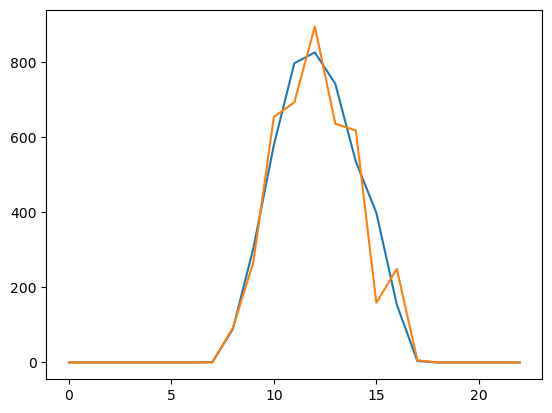

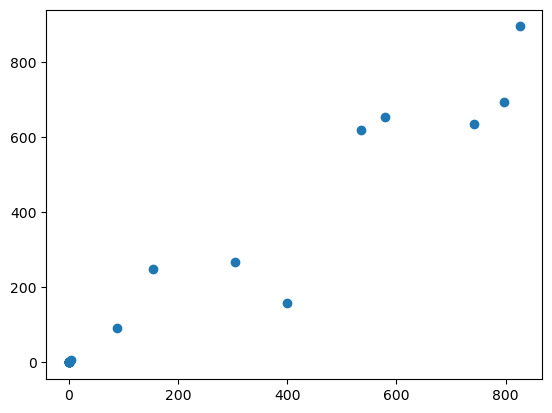

In [203]:
plt.plot(y_test[1:24])
plt.plot(y_pred_DT[1:24])
plt.show()
plt.scatter(y_test,y_pred_DT)

In [204]:
#Evaluate errors
MAE_DT=metrics.mean_absolute_error(y_test,y_pred_DT) 
MBE_DT=np.mean(y_test-y_pred_DT) 
MSE_DT=metrics.mean_squared_error(y_test,y_pred_DT)  
RMSE_DT= np.sqrt(metrics.mean_squared_error(y_test,y_pred_DT))
cvRMSE_DT=RMSE_DT/np.mean(y_test)
NMBE_DT=MBE_DT/np.mean(y_test)
print(MAE_DT, MBE_DT,MSE_DT, RMSE_DT,cvRMSE_DT,NMBE_DT)

33.958333333333336 6.708333333333333 4472.291666666667 66.87519470376641 0.3623035378985088 0.036343115124153495


### Random Forest

In [205]:
from sklearn.ensemble import RandomForestRegressor

In [206]:
parameters = {'bootstrap': True,
              'min_samples_leaf': 3,
              'n_estimators': 200, 
              'min_samples_split': 15,
              'max_features': 'sqrt',
              'max_depth': 20,
              'max_leaf_nodes': None}
RF_model = RandomForestRegressor(**parameters)
RF_model.fit(X_train, y_train)
y_pred_RF = RF_model.predict(X_test)

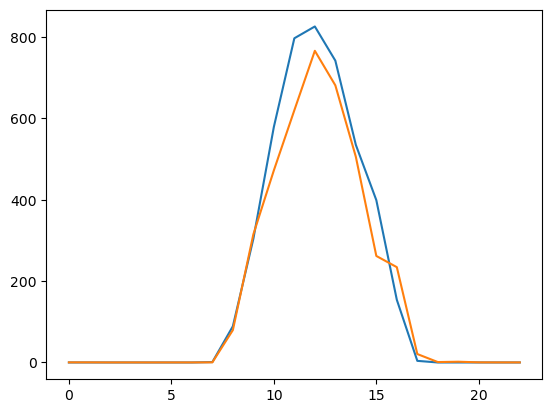

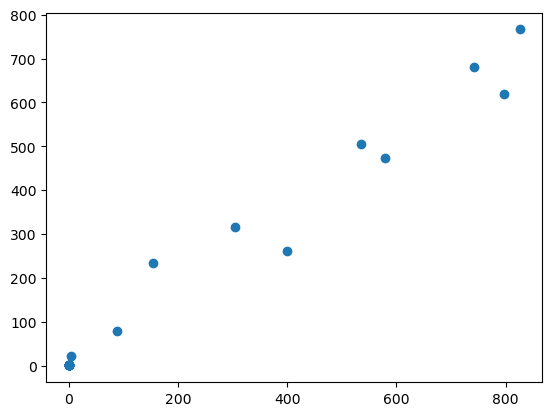

In [207]:
plt.plot(y_test[1:24])
plt.plot(y_pred_RF[1:24])
plt.show()
plt.scatter(y_test,y_pred_RF)

In [208]:
#Evaluate errors
MAE_RF=metrics.mean_absolute_error(y_test,y_pred_RF) 
MBE_RF=np.mean(y_test-y_pred_DT) 
MSE_RF=metrics.mean_squared_error(y_test,y_pred_RF)  
RMSE_RF= np.sqrt(metrics.mean_squared_error(y_test,y_pred_RF))
cvRMSE_RF=RMSE_RF/np.mean(y_test)
NMBE_RF=MBE_RF/np.mean(y_test)
print(MAE_RF,MBE_RF,MSE_RF,RMSE_RF,cvRMSE_RF,NMBE_RF)

28.908413897064005 6.708333333333333 3190.446148358466 56.484034455396916 0.30600831307664245 0.036343115124153495


### Gradient Boosting

In [209]:
from sklearn.ensemble import GradientBoostingRegressor
GB_model = GradientBoostingRegressor()
GB_model.fit(X_train, y_train)
y_pred_GB =GB_model.predict(X_test)

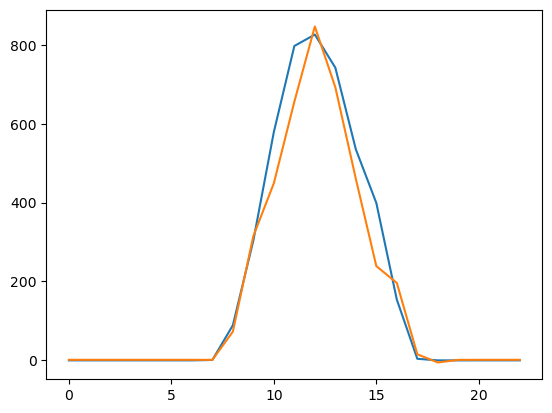

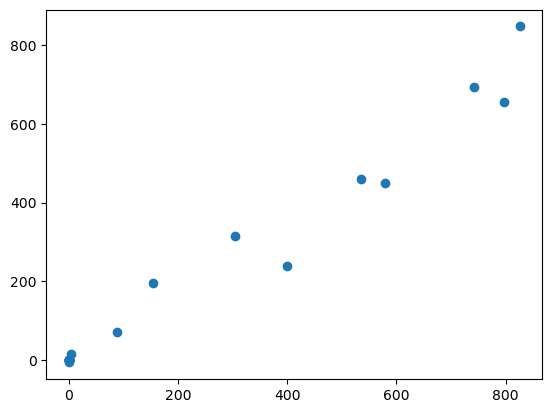

In [210]:
plt.plot(y_test[1:24])
plt.plot(y_pred_GB[1:24])
plt.show()
plt.scatter(y_test,y_pred_GB)

In [211]:
#Evaluate errors
MAE_GB=metrics.mean_absolute_error(y_test,y_pred_GB) 
MBE_GB=np.mean(y_test-y_pred_GB)
MSE_GB=metrics.mean_squared_error(y_test,y_pred_GB)  
RMSE_GB= np.sqrt(metrics.mean_squared_error(y_test,y_pred_GB))
cvRMSE_GB=RMSE_GB/np.mean(y_test)
NMBE_GB=MBE_GB/np.mean(y_test)
print(MAE_GB,MBE_GB,MSE_GB,RMSE_GB,cvRMSE_GB,NMBE_GB)

28.292921047495835 19.79792687536151 3053.3833156530927 55.25742769667344 0.29936303944021725 0.10725739164981406


### Boostrapping

In [212]:
from sklearn.ensemble import BaggingRegressor

BT_model_20 = BaggingRegressor()
BT_model_20.fit(X_train, y_train)
y_pred_BT =BT_model_20.predict(X_test)

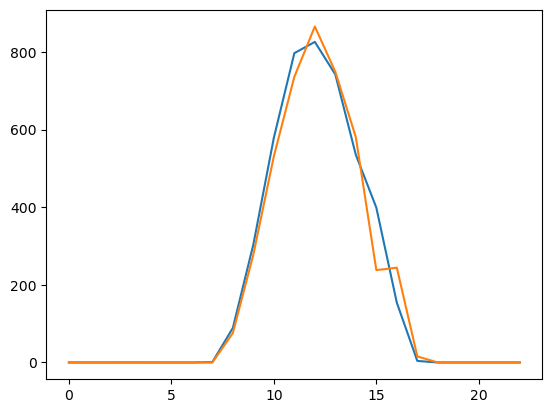

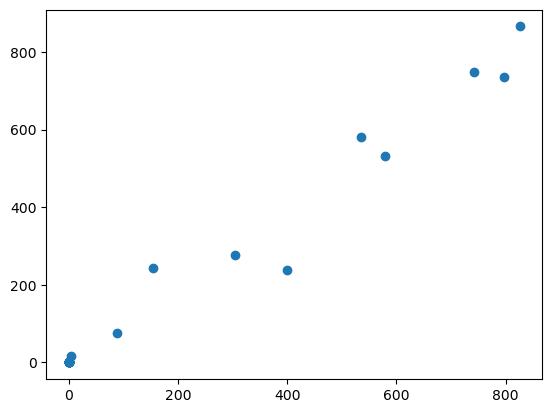

In [213]:
plt.plot(y_test[1:24])
plt.plot(y_pred_BT[1:24])
plt.show()
plt.scatter(y_test,y_pred_BT)

In [214]:
#Evaluate errors
MAE_BT=metrics.mean_absolute_error(y_test,y_pred_BT) 
MBE_BT=np.mean(y_test-y_pred_BT)
MSE_BT=metrics.mean_squared_error(y_test,y_pred_BT)  
RMSE_BT= np.sqrt(metrics.mean_squared_error(y_test,y_pred_BT))
cvRMSE_BT=RMSE_BT/np.mean(y_test)
NMBE_BT=MBE_BT/np.mean(y_test)
print(MAE_BT,MBE_BT,MSE_BT,RMSE_BT,cvRMSE_BT,NMBE_BT)

20.999999999999996 4.816666666666664 1863.8974999999998 43.172879218324084 0.23389370231146228 0.026094808126410816


#### Comparing the results

In [215]:
data = {
    'Auto Regressive': [MAE_AR, MBE_AR, MSE_AR, RMSE_AR, cvRMSE_AR, NMBE_AR],
    'Linear Regression': [MAE_LR, MBE_LR, MSE_LR, RMSE_LR, cvRMSE_LR, NMBE_LR],
    'Decision Trees': [MAE_DT, MBE_DT, MSE_DT, RMSE_DT, cvRMSE_DT, NMBE_DT],
    'Random Forest': [MAE_RF, MBE_RF, MSE_RF, RMSE_RF, cvRMSE_RF, NMBE_RF],
    'Gradient Boosting': [MAE_GB, MBE_GB, MSE_GB, RMSE_GB, cvRMSE_GB, NMBE_GB],
    'Bootstrapping': [MAE_BT, MBE_BT, MSE_BT, RMSE_BT, cvRMSE_BT, NMBE_BT],
}


df = pd.DataFrame(data)

df.index = ['MAE', 'MBE', 'MSE', 'RMSE', 'cvRMSE', 'NMBE']

# convert cvRMSE and NMBE to percentage format
df.loc[['cvRMSE', 'NMBE']] = df.loc[['cvRMSE', 'NMBE']] * 100
df.loc[['cvRMSE', 'NMBE']] = df.loc[['cvRMSE', 'NMBE']].applymap("{:.2f}%".format)


print(df.transpose())

                         MAE        MBE          MSE       RMSE  cvRMSE  \
Auto Regressive    56.373691   -7.52296  6992.024838  83.618328  31.72%   
Linear Regression  45.284079  12.794944  3462.912146  58.846513  31.88%   
Decision Trees     33.958333   6.708333  4472.291667  66.875195  36.23%   
Random Forest      28.908414   6.708333  3190.446148  56.484034  30.60%   
Gradient Boosting  28.292921  19.797927  3053.383316  55.257428  29.94%   
Bootstrapping           21.0   4.816667    1863.8975  43.172879  23.39%   

                     NMBE  
Auto Regressive    -2.85%  
Linear Regression   6.93%  
Decision Trees      3.63%  
Random Forest       3.63%  
Gradient Boosting  10.73%  
Bootstrapping       2.61%  


Looking at the table above, the best method seems to be Bootstrapping. So, to choose the best combination of features, this will be the model used

## Improving the model

To identify the optimal combination of features, we will explore various combinations.

In [216]:
#Temperature, Relative Humidity, Solar-2

In [217]:
Z = df_data.values
Y = Z[:,0]
#X = Z[:,[1,2,5,6,7,8,9,10,11]]
X=Z[:,[1,2,10]]

X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 24, shuffle = False)
print(X_train)
print(y_train)

[[12.2 90.   0. ]
 [12.1 90.   0. ]
 [11.5 91.   0. ]
 ...
 [13.5 95.   0. ]
 [12.4 94.   0. ]
 [11.9 93.   0. ]]
[0. 0. 0. ... 0. 0. 0.]


In [218]:
BT_model = BaggingRegressor()
BT_model.fit(X_train, y_train)
y_pred_BT =BT_model.predict(X_test)

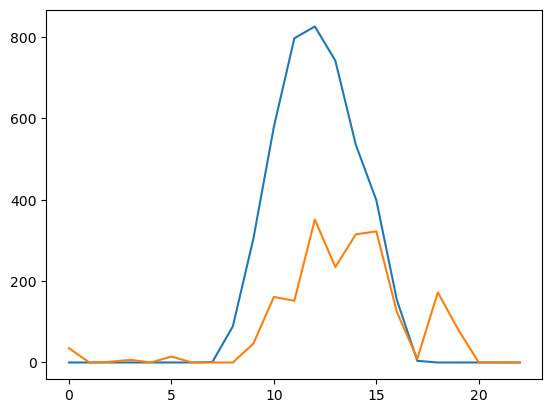

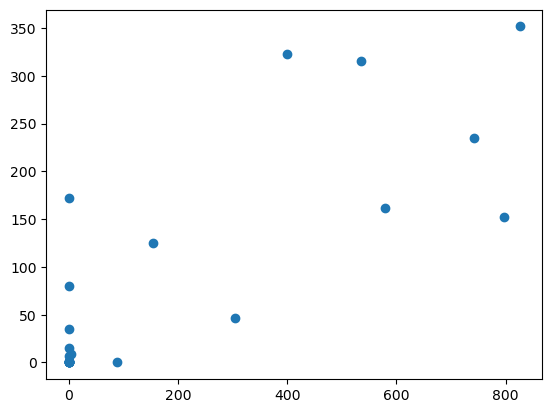

In [219]:
plt.plot(y_test[1:24])
plt.plot(y_pred_BT[1:24])
plt.show()
plt.scatter(y_test,y_pred_BT)

In [220]:
#Evaluate errors
MAE_BT=metrics.mean_absolute_error(y_test,y_pred_BT) 
MBE_BT=np.mean(y_test-y_pred_BT)
MSE_BT=metrics.mean_squared_error(y_test,y_pred_BT)  
RMSE_BT= np.sqrt(metrics.mean_squared_error(y_test,y_pred_BT))
cvRMSE_BT=RMSE_BT/np.mean(y_test)
NMBE_BT=MBE_BT/np.mean(y_test)
print(MAE_BT,MBE_BT,MSE_BT,RMSE_BT,cvRMSE_BT,NMBE_BT)

126.44916666666666 100.12583333333333 51700.22363125 227.37683178206615 1.2318383663136765 0.5424424379232505


In [221]:
#Rain, Relative Humidity, Solar-1

In [222]:
Z = df_data.values
Y = Z[:,0]
#X = Z[:,[1,2,5,6,7,8,9,10,11]]
X=Z[:,[2,6,9]]

X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 24, shuffle = False)
print(X_train)
print(y_train)

[[90.  0.  0.]
 [90.  0.  0.]
 [91.  0.  0.]
 ...
 [95.  0.  0.]
 [94.  0.  0.]
 [93.  0.  0.]]
[0. 0. 0. ... 0. 0. 0.]


In [223]:
BT_model = BaggingRegressor()
BT_model.fit(X_train, y_train)
y_pred_BT =BT_model.predict(X_test)

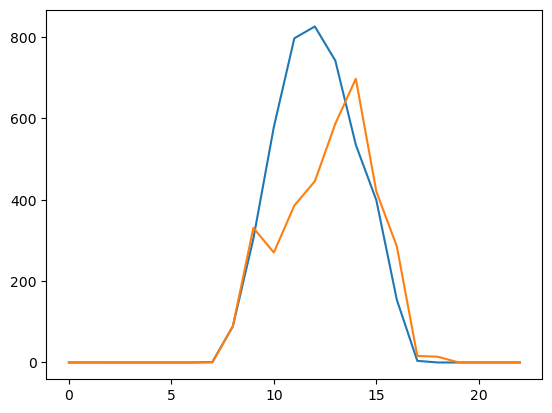

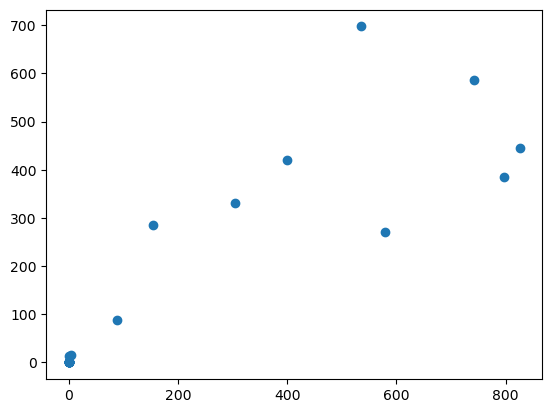

In [224]:
plt.plot(y_test[1:24])
plt.plot(y_pred_BT[1:24])
plt.show()
plt.scatter(y_test,y_pred_BT)

In [225]:
#Evaluate errors
MAE_BT=metrics.mean_absolute_error(y_test,y_pred_BT) 
MBE_BT=np.mean(y_test-y_pred_BT)
MSE_BT=metrics.mean_squared_error(y_test,y_pred_BT)  
RMSE_BT= np.sqrt(metrics.mean_squared_error(y_test,y_pred_BT))
cvRMSE_BT=RMSE_BT/np.mean(y_test)
NMBE_BT=MBE_BT/np.mean(y_test)
print(MAE_BT,MBE_BT,MSE_BT,RMSE_BT,cvRMSE_BT,NMBE_BT)

67.80533741472438 36.88524642216707 19931.694853783953 141.17965453203217 0.7648559162006258 0.1998297774564356


In [226]:
#Relative Humidity, Direct Radiation, Solar-2

In [227]:
Z = df_data.values
Y = Z[:,0]
#X = Z[:,[1,2,5,6,7,8,9,10,11]]
X=Z[:,[2,6,10]]

X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 24, shuffle = False)
print(X_train)
print(y_train)

[[90.  0.  0.]
 [90.  0.  0.]
 [91.  0.  0.]
 ...
 [95.  0.  0.]
 [94.  0.  0.]
 [93.  0.  0.]]
[0. 0. 0. ... 0. 0. 0.]


In [228]:
BT_model = BaggingRegressor()
BT_model.fit(X_train, y_train)
y_pred_BT =BT_model.predict(X_test)

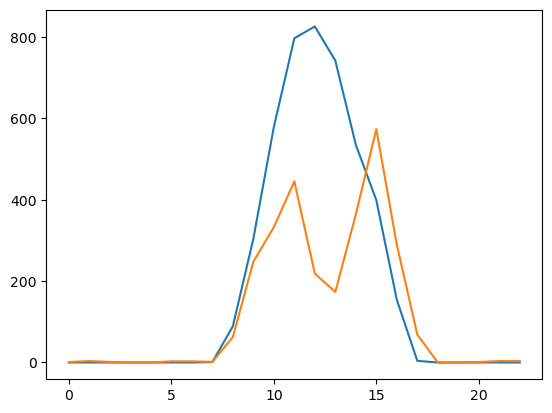

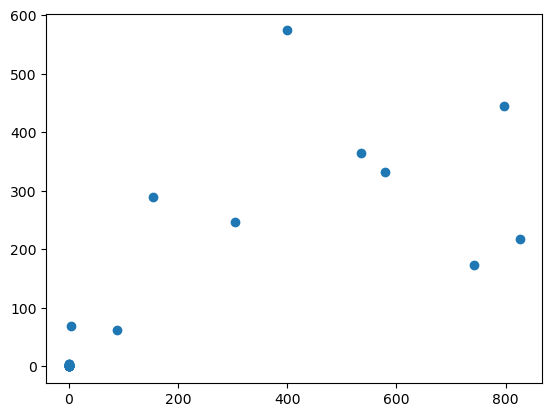

In [229]:
plt.plot(y_test[1:24])
plt.plot(y_pred_BT[1:24])
plt.show()
plt.scatter(y_test,y_pred_BT)

In [230]:
#Evaluate errors
MAE_BT=metrics.mean_absolute_error(y_test,y_pred_BT) 
MBE_BT=np.mean(y_test-y_pred_BT)
MSE_BT=metrics.mean_squared_error(y_test,y_pred_BT)  
RMSE_BT= np.sqrt(metrics.mean_squared_error(y_test,y_pred_BT))
cvRMSE_BT=RMSE_BT/np.mean(y_test)
NMBE_BT=MBE_BT/np.mean(y_test)
print(MAE_BT,MBE_BT,MSE_BT,RMSE_BT,cvRMSE_BT,NMBE_BT)

101.01102062265255 67.99453493290301 40126.354975021364 200.31563836860408 1.0852314494010153 0.3683676836094068


In [231]:
#Temperature, Relative Humidity, Direct Radiation

In [232]:
Z = df_data.values
Y = Z[:,0]
#X = Z[:,[1,2,5,6,7,8,9,10,11]]
X=Z[:,[1,2,6]]

X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 24, shuffle = False)
print(X_train)
print(y_train)

[[12.2 90.   0. ]
 [12.1 90.   0. ]
 [11.5 91.   0. ]
 ...
 [13.5 95.   0. ]
 [12.4 94.   0. ]
 [11.9 93.   0. ]]
[0. 0. 0. ... 0. 0. 0.]


In [233]:
BT_model = BaggingRegressor()
BT_model.fit(X_train, y_train)
y_pred_BT =BT_model.predict(X_test)

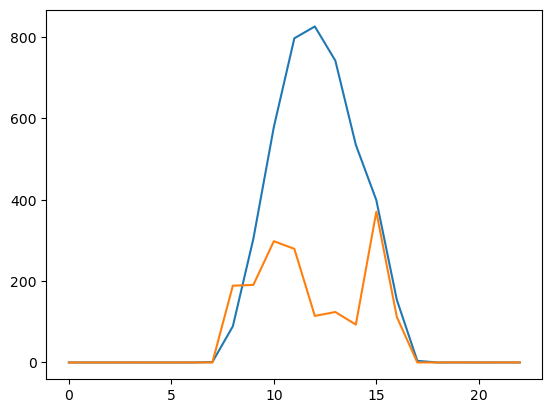

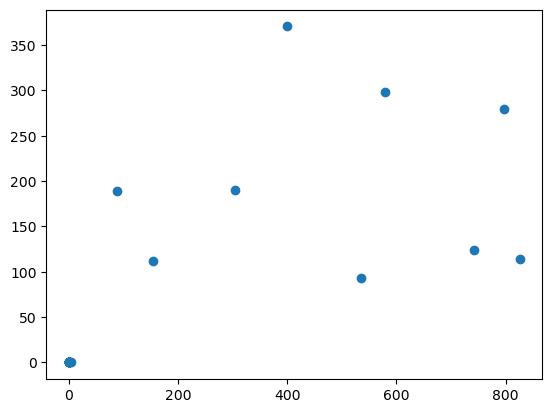

In [234]:
plt.plot(y_test[1:24])
plt.plot(y_pred_BT[1:24])
plt.show()
plt.scatter(y_test,y_pred_BT)

In [235]:
#Evaluate errors
MAE_BT=metrics.mean_absolute_error(y_test,y_pred_BT) 
MBE_BT=np.mean(y_test-y_pred_BT)
MSE_BT=metrics.mean_squared_error(y_test,y_pred_BT)  
RMSE_BT= np.sqrt(metrics.mean_squared_error(y_test,y_pred_BT))
cvRMSE_BT=RMSE_BT/np.mean(y_test)
NMBE_BT=MBE_BT/np.mean(y_test)
print(MAE_BT,MBE_BT,MSE_BT,RMSE_BT,cvRMSE_BT,NMBE_BT)

119.13472222222224 110.75555555555555 60652.41956018519 246.2771194410581 1.3342327012608113 0.6000300978179082


In [236]:
#Relative Humidity, Solar-1, Solar-2

In [237]:
Z = df_data.values
Y = Z[:,0]
#X = Z[:,[1,2,5,6,7,8,9,10,11]]
X=Z[:,[2,9,10]]

X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 24, shuffle = False)
print(X_train)
print(y_train)

[[90.  0.  0.]
 [90.  0.  0.]
 [91.  0.  0.]
 ...
 [95.  0.  0.]
 [94.  0.  0.]
 [93.  0.  0.]]
[0. 0. 0. ... 0. 0. 0.]


In [238]:
BT_model = BaggingRegressor()
BT_model.fit(X_train, y_train)
y_pred_BT =BT_model.predict(X_test)

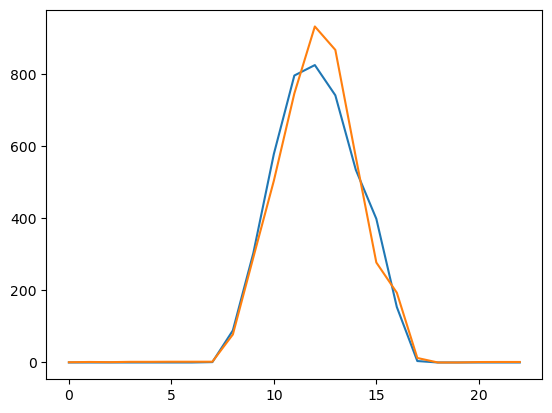

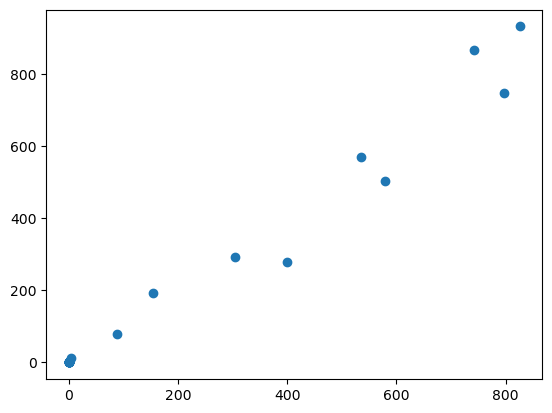

In [239]:
plt.plot(y_test[1:24])
plt.plot(y_pred_BT[1:24])
plt.show()
plt.scatter(y_test,y_pred_BT)

In [240]:
#Evaluate errors
MAE_BT=metrics.mean_absolute_error(y_test,y_pred_BT) 
MBE_BT=np.mean(y_test-y_pred_BT)
MSE_BT=metrics.mean_squared_error(y_test,y_pred_BT)  
RMSE_BT= np.sqrt(metrics.mean_squared_error(y_test,y_pred_BT))
cvRMSE_BT=RMSE_BT/np.mean(y_test)
NMBE_BT=MBE_BT/np.mean(y_test)
print(MAE_BT,MBE_BT,MSE_BT,RMSE_BT,cvRMSE_BT,NMBE_BT)

25.11765266898421 -2.735708224539773 2219.7662324942153 47.11439517275177 0.2552472876176168 -0.014820992638590191


In [241]:
#Relative Humidity, Direct Radiation, Solar-1

In [242]:
Z = df_data.values
Y = Z[:,0]
#X = Z[:,[1,2,5,6,7,8,9,10,11]]
X=Z[:,[2,6,9]]

X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 24, shuffle = False)
print(X_train)
print(y_train)

[[90.  0.  0.]
 [90.  0.  0.]
 [91.  0.  0.]
 ...
 [95.  0.  0.]
 [94.  0.  0.]
 [93.  0.  0.]]
[0. 0. 0. ... 0. 0. 0.]


In [243]:
BT_model = BaggingRegressor()
BT_model.fit(X_train, y_train)
y_pred_BT =BT_model.predict(X_test)

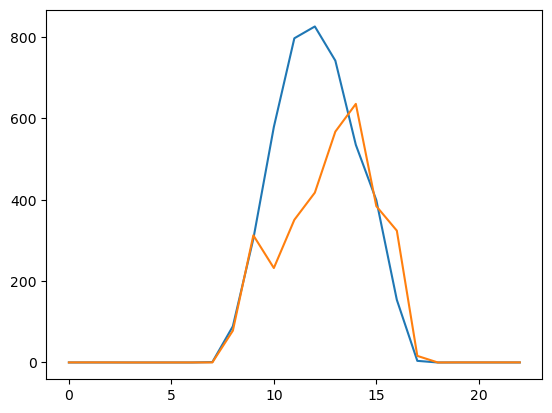

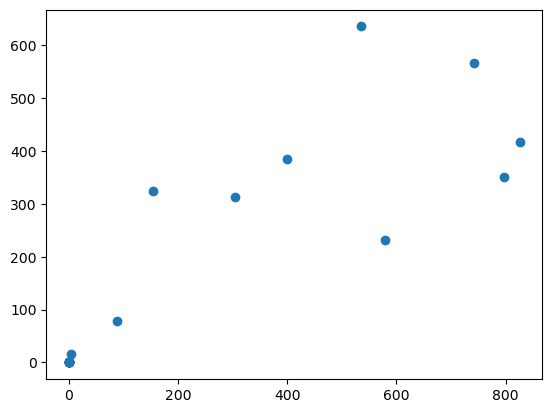

In [244]:
plt.plot(y_test[1:24])
plt.plot(y_pred_BT[1:24])
plt.show()
plt.scatter(y_test,y_pred_BT)

In [245]:
#Evaluate errors
MAE_BT=metrics.mean_absolute_error(y_test,y_pred_BT) 
MBE_BT=np.mean(y_test-y_pred_BT)
MSE_BT=metrics.mean_squared_error(y_test,y_pred_BT)  
RMSE_BT= np.sqrt(metrics.mean_squared_error(y_test,y_pred_BT))
cvRMSE_BT=RMSE_BT/np.mean(y_test)
NMBE_BT=MBE_BT/np.mean(y_test)
print(MAE_BT,MBE_BT,MSE_BT,RMSE_BT,cvRMSE_BT,NMBE_BT)

70.6828923989704 46.19679060553216 23183.777630104418 152.26220026685684 0.8248967960281183 0.25027606648595296


In [246]:
#Temperature, Relative Humidity, Direct Radiation

In [247]:
Z = df_data.values
Y = Z[:,0]
#X = Z[:,[1,2,5,6,7,8,9,10,11]]
X=Z[:,[1,2,6]]

X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 24, shuffle = False)
print(X_train)
print(y_train)

[[12.2 90.   0. ]
 [12.1 90.   0. ]
 [11.5 91.   0. ]
 ...
 [13.5 95.   0. ]
 [12.4 94.   0. ]
 [11.9 93.   0. ]]
[0. 0. 0. ... 0. 0. 0.]


In [248]:
BT_model = BaggingRegressor()
BT_model.fit(X_train, y_train)
y_pred_BT =BT_model.predict(X_test)

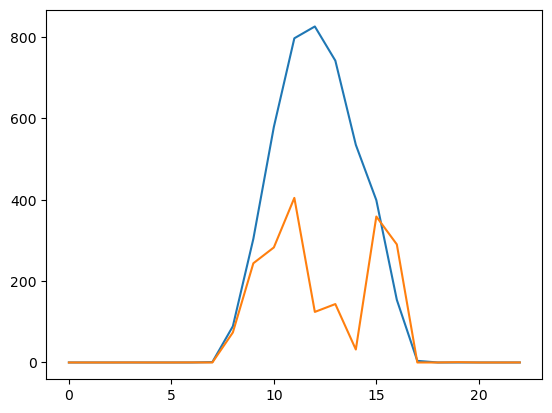

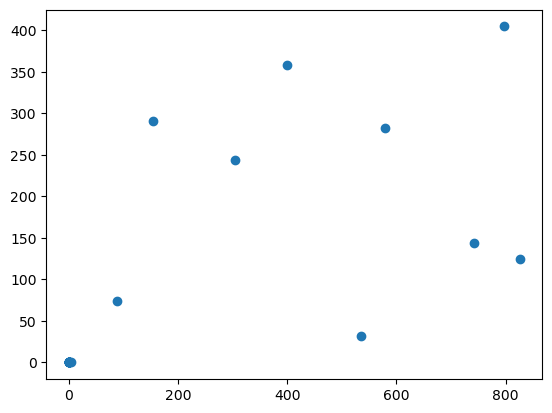

In [249]:
plt.plot(y_test[1:24])
plt.plot(y_pred_BT[1:24])
plt.show()
plt.scatter(y_test,y_pred_BT)

In [250]:
#Evaluate errors
MAE_BT=metrics.mean_absolute_error(y_test,y_pred_BT) 
MBE_BT=np.mean(y_test-y_pred_BT)
MSE_BT=metrics.mean_squared_error(y_test,y_pred_BT)  
RMSE_BT= np.sqrt(metrics.mean_squared_error(y_test,y_pred_BT))
cvRMSE_BT=RMSE_BT/np.mean(y_test)
NMBE_BT=MBE_BT/np.mean(y_test)
print(MAE_BT,MBE_BT,MSE_BT,RMSE_BT,cvRMSE_BT,NMBE_BT)

114.57229166666666 103.119375 57055.90223854166 238.8637733909051 1.294070104149373 0.5586602708803612


In [251]:
#Solar-2, Solar-1, Relative Humidity, Direct Radiation

In [252]:
Z = df_data.values
Y = Z[:,0]
#X = Z[:,[1,2,5,6,7,8,9,10,11]]
X=Z[:,[2,6,9,10]]



X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 24, shuffle = False)
print(X_train)
print(y_train)

[[90.  0.  0.  0.]
 [90.  0.  0.  0.]
 [91.  0.  0.  0.]
 ...
 [95.  0.  0.  0.]
 [94.  0.  0.  0.]
 [93.  0.  0.  0.]]
[0. 0. 0. ... 0. 0. 0.]


In [253]:
BT_model_9 = BaggingRegressor()
BT_model_9.fit(X_train, y_train)
y_pred_BT =BT_model_9.predict(X_test)

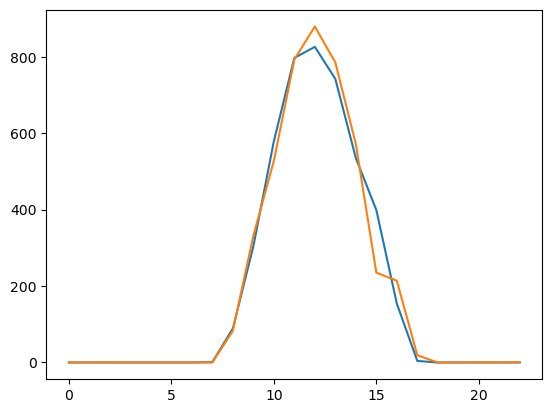

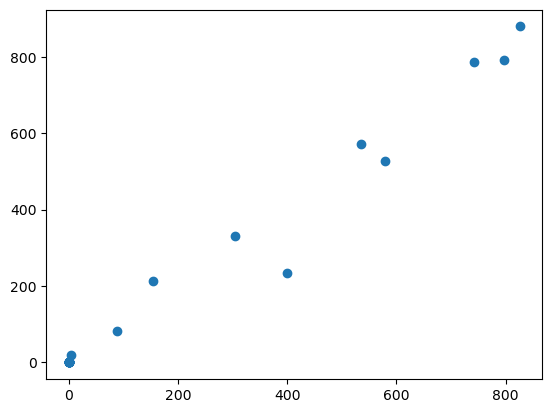

In [254]:
plt.plot(y_test[1:24])
plt.plot(y_pred_BT[1:24])
plt.show()
plt.scatter(y_test,y_pred_BT)

In [255]:
#Evaluate errors
MAE_BT=metrics.mean_absolute_error(y_test,y_pred_BT) 
MBE_BT=np.mean(y_test-y_pred_BT)
MSE_BT=metrics.mean_squared_error(y_test,y_pred_BT)  
RMSE_BT= np.sqrt(metrics.mean_squared_error(y_test,y_pred_BT))
cvRMSE_BT=RMSE_BT/np.mean(y_test)
NMBE_BT=MBE_BT/np.mean(y_test)
print(MAE_BT,MBE_BT,MSE_BT,RMSE_BT,cvRMSE_BT,NMBE_BT)

19.337716757750506 -0.4633730419605205 1673.1835226456806 40.904566036638016 0.22160487243325336 -0.002510373139289501


In [256]:
#Solar-2, Direct Radiation, Solar-1, Temperature

In [257]:
Z = df_data.values
Y = Z[:,0]
#X = Z[:,[1,2,5,6,7,8,9,10,11]]
X=Z[:,[1,6,9,10]]

X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 24, shuffle = False)
print(X_train)
print(y_train)

[[12.2  0.   0.   0. ]
 [12.1  0.   0.   0. ]
 [11.5  0.   0.   0. ]
 ...
 [13.5  0.   0.   0. ]
 [12.4  0.   0.   0. ]
 [11.9  0.   0.   0. ]]
[0. 0. 0. ... 0. 0. 0.]


In [258]:
BT_model = BaggingRegressor()
BT_model.fit(X_train, y_train)
y_pred_BT =BT_model.predict(X_test)

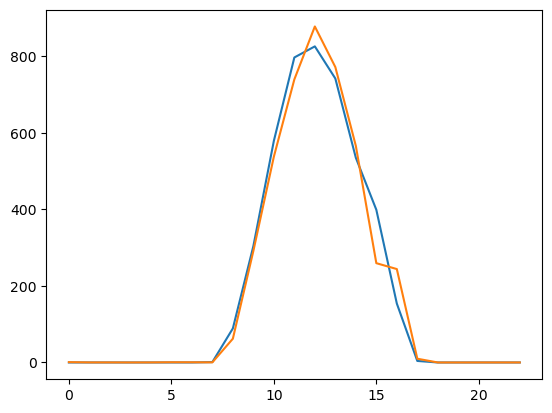

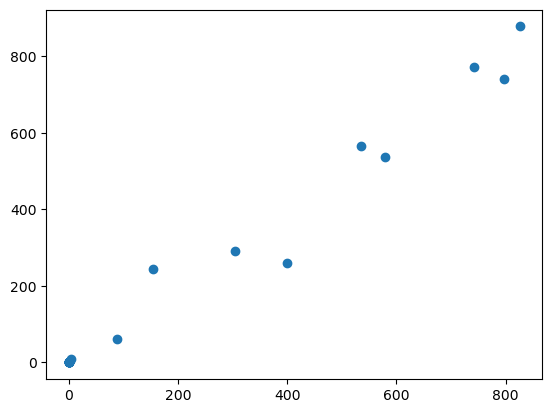

In [259]:
plt.plot(y_test[1:24])
plt.plot(y_pred_BT[1:24])
plt.show()
plt.scatter(y_test,y_pred_BT)

In [260]:
#Evaluate errors
MAE_BT=metrics.mean_absolute_error(y_test,y_pred_BT) 
MBE_BT=np.mean(y_test-y_pred_BT)
MSE_BT=metrics.mean_squared_error(y_test,y_pred_BT)  
RMSE_BT= np.sqrt(metrics.mean_squared_error(y_test,y_pred_BT))
cvRMSE_BT=RMSE_BT/np.mean(y_test)
NMBE_BT=MBE_BT/np.mean(y_test)
print(MAE_BT,MBE_BT,MSE_BT,RMSE_BT,cvRMSE_BT,NMBE_BT)

20.41083044121118 2.7899644511692308 1585.2801674337609 39.81557694463011 0.21570515726210443 0.01511493156389651


In [261]:
#Solar-1, Temperature, Relative Humidity, Direct Radiation

In [262]:
Z = df_data.values
Y = Z[:,0]
#X = Z[:,[1,2,5,6,7,8,9,10,11]]
X=Z[:,[1,2,6,9]]

X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 24, shuffle = False)
print(X_train)
print(y_train)

[[12.2 90.   0.   0. ]
 [12.1 90.   0.   0. ]
 [11.5 91.   0.   0. ]
 ...
 [13.5 95.   0.   0. ]
 [12.4 94.   0.   0. ]
 [11.9 93.   0.   0. ]]
[0. 0. 0. ... 0. 0. 0.]


In [263]:
BT_model = BaggingRegressor()
BT_model.fit(X_train, y_train)
y_pred_BT =BT_model.predict(X_test)

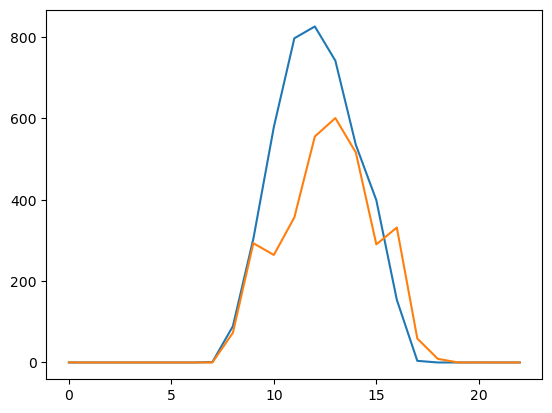

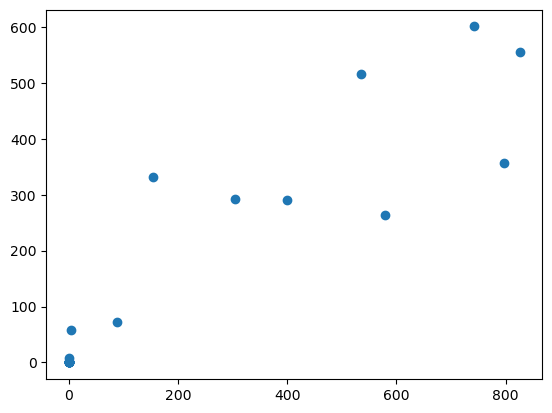

In [264]:
plt.plot(y_test[1:24])
plt.plot(y_pred_BT[1:24])
plt.show()
plt.scatter(y_test,y_pred_BT)

In [265]:
#Evaluate errors
MAE_BT=metrics.mean_absolute_error(y_test,y_pred_BT) 
MBE_BT=np.mean(y_test-y_pred_BT)
MSE_BT=metrics.mean_squared_error(y_test,y_pred_BT)  
RMSE_BT= np.sqrt(metrics.mean_squared_error(y_test,y_pred_BT))
cvRMSE_BT=RMSE_BT/np.mean(y_test)
NMBE_BT=MBE_BT/np.mean(y_test)
print(MAE_BT,MBE_BT,MSE_BT,RMSE_BT,cvRMSE_BT,NMBE_BT)

65.16583333333334 45.00083333333333 18050.770516666667 134.35315596094745 0.7278726282308665 0.2437968397291196


In [266]:
#Solar-1 Relative Humidity, Solar-2, Temperature

In [267]:
Z = df_data.values
Y = Z[:,0]
#X = Z[:,[1,2,5,6,7,8,9,10,11]]
X=Z[:,[1,2,9,10]]

X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 24, shuffle = False)
print(X_train)
print(y_train)

[[12.2 90.   0.   0. ]
 [12.1 90.   0.   0. ]
 [11.5 91.   0.   0. ]
 ...
 [13.5 95.   0.   0. ]
 [12.4 94.   0.   0. ]
 [11.9 93.   0.   0. ]]
[0. 0. 0. ... 0. 0. 0.]


In [268]:
BT_model = BaggingRegressor()
BT_model.fit(X_train, y_train)
y_pred_BT =BT_model.predict(X_test)

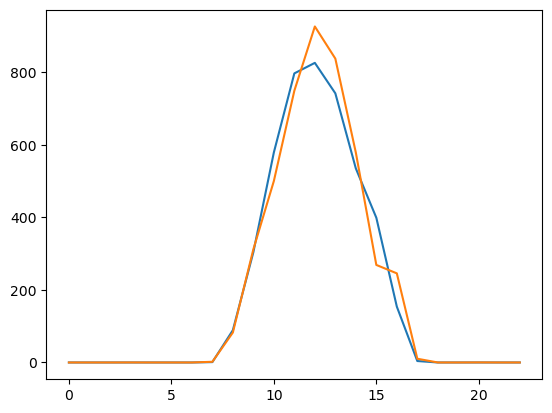

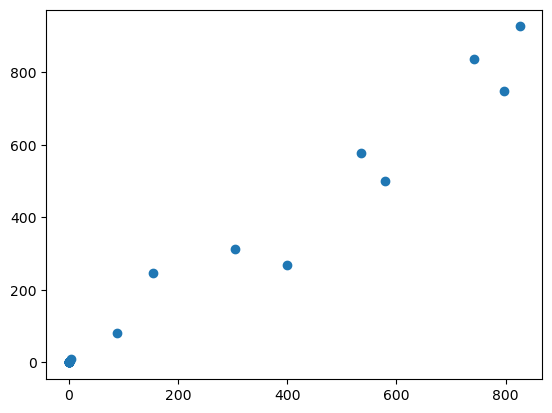

In [269]:
plt.plot(y_test[1:24])
plt.plot(y_pred_BT[1:24])
plt.show()
plt.scatter(y_test,y_pred_BT)

In [270]:
#Evaluate errors
MAE_BT=metrics.mean_absolute_error(y_test,y_pred_BT) 
MBE_BT=np.mean(y_test-y_pred_BT)
MSE_BT=metrics.mean_squared_error(y_test,y_pred_BT)  
RMSE_BT= np.sqrt(metrics.mean_squared_error(y_test,y_pred_BT))
cvRMSE_BT=RMSE_BT/np.mean(y_test)
NMBE_BT=MBE_BT/np.mean(y_test)
print(MAE_BT,MBE_BT,MSE_BT,RMSE_BT,cvRMSE_BT,NMBE_BT)

25.40833333333333 -3.483333333333334 2295.526666666667 47.91165481035556 0.2595665271892852 -0.01887133182844244


In [271]:
#Solar-2, Relative Humidity, Temperature, Direct Radiation

In [272]:
Z = df_data.values
Y = Z[:,0]
#X = Z[:,[1,2,5,6,7,8,9,10,11]]
X=Z[:,[1,2,6,10]]

X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 24, shuffle = False)
print(X_train)
print(y_train)

[[12.2 90.   0.   0. ]
 [12.1 90.   0.   0. ]
 [11.5 91.   0.   0. ]
 ...
 [13.5 95.   0.   0. ]
 [12.4 94.   0.   0. ]
 [11.9 93.   0.   0. ]]
[0. 0. 0. ... 0. 0. 0.]


In [273]:
BT_model = BaggingRegressor()
BT_model.fit(X_train, y_train)
y_pred_BT =BT_model.predict(X_test)

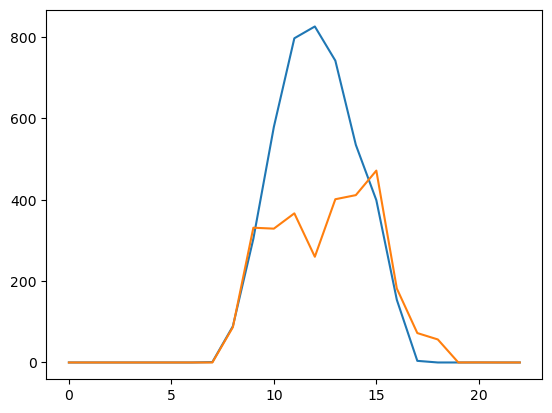

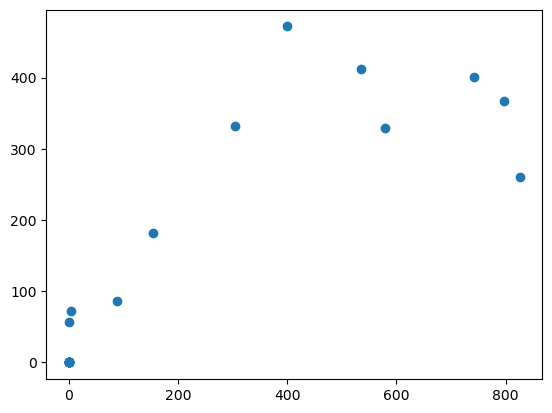

In [274]:
plt.plot(y_test[1:24])
plt.plot(y_pred_BT[1:24])
plt.show()
plt.scatter(y_test,y_pred_BT)

In [275]:
#Evaluate errors
MAE_BT=metrics.mean_absolute_error(y_test,y_pred_BT) 
MBE_BT=np.mean(y_test-y_pred_BT)
MSE_BT=metrics.mean_squared_error(y_test,y_pred_BT)  
RMSE_BT= np.sqrt(metrics.mean_squared_error(y_test,y_pred_BT))
cvRMSE_BT=RMSE_BT/np.mean(y_test)
NMBE_BT=MBE_BT/np.mean(y_test)
print(MAE_BT,MBE_BT,MSE_BT,RMSE_BT,cvRMSE_BT,NMBE_BT)

81.95833333333333 60.883333333333326 29760.209166666667 172.5114754637113 0.9345994156047563 0.3298419864559819


In [276]:
#Temperature, Direct Radiation, Month, Solar-1, Solar-2

In [277]:
Z = df_data.values
Y = Z[:,0]
#X = Z[:,[1,2,5,6,7,8,9,10,11]]
X=Z[:,[1,6,7,9,10]]

X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 24, shuffle = False)
print(X_train)
print(y_train)

[[12.2  0.   1.   0.   0. ]
 [12.1  0.   1.   0.   0. ]
 [11.5  0.   1.   0.   0. ]
 ...
 [13.5  0.  12.   0.   0. ]
 [12.4  0.  12.   0.   0. ]
 [11.9  0.  12.   0.   0. ]]
[0. 0. 0. ... 0. 0. 0.]


In [278]:
BT_model = BaggingRegressor()
BT_model.fit(X_train, y_train)
y_pred_BT =BT_model.predict(X_test)

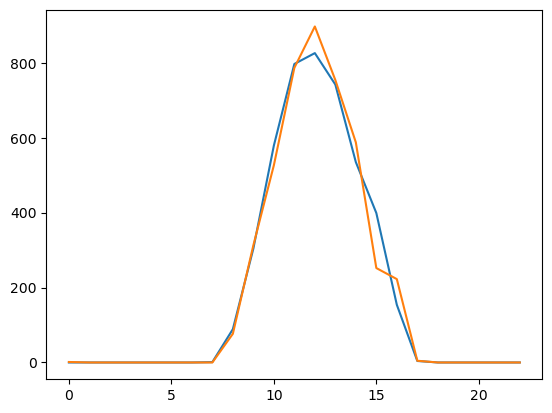

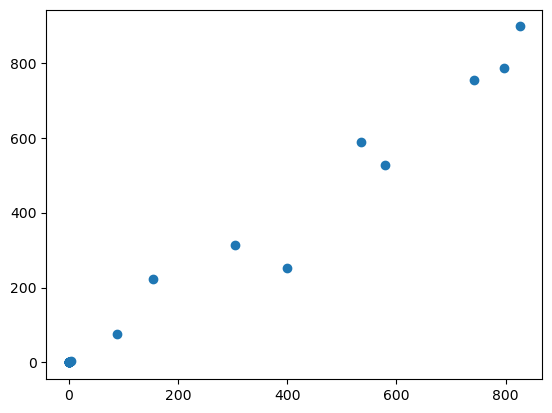

In [279]:
plt.plot(y_test[1:24])
plt.plot(y_pred_BT[1:24])
plt.show()
plt.scatter(y_test,y_pred_BT)

In [280]:
#Evaluate errors
MAE_BT=metrics.mean_absolute_error(y_test,y_pred_BT) 
MBE_BT=np.mean(y_test-y_pred_BT)
MSE_BT=metrics.mean_squared_error(y_test,y_pred_BT)  
RMSE_BT= np.sqrt(metrics.mean_squared_error(y_test,y_pred_BT))
cvRMSE_BT=RMSE_BT/np.mean(y_test)
NMBE_BT=MBE_BT/np.mean(y_test)
print(MAE_BT,MBE_BT,MSE_BT,RMSE_BT,cvRMSE_BT,NMBE_BT)

18.270454059829067 0.33787927350426966 1557.2344340079173 39.46180981668121 0.2137885859143 0.0018304971927996549


In [281]:
#Temperature, Direct Radiation, Month, Solar-1, Relative Humidity

In [282]:
Z = df_data.values
Y = Z[:,0]
#X = Z[:,[1,2,5,6,7,8,9,10,11]]
X=Z[:,[1,2,6,7,9]]

X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 24, shuffle = False)
print(X_train)
print(y_train)

[[12.2 90.   0.   1.   0. ]
 [12.1 90.   0.   1.   0. ]
 [11.5 91.   0.   1.   0. ]
 ...
 [13.5 95.   0.  12.   0. ]
 [12.4 94.   0.  12.   0. ]
 [11.9 93.   0.  12.   0. ]]
[0. 0. 0. ... 0. 0. 0.]


In [283]:
BT_model = BaggingRegressor()
BT_model.fit(X_train, y_train)
y_pred_BT =BT_model.predict(X_test)

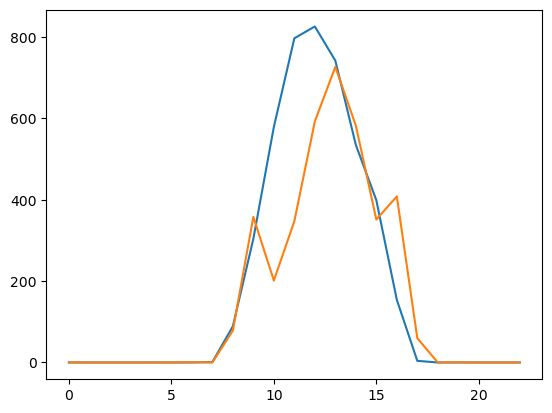

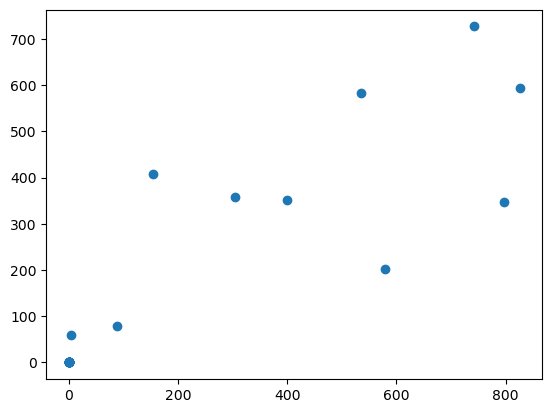

In [284]:
plt.plot(y_test[1:24])
plt.plot(y_pred_BT[1:24])
plt.show()
plt.scatter(y_test,y_pred_BT)

In [285]:
#Evaluate errors
MAE_BT=metrics.mean_absolute_error(y_test,y_pred_BT) 
MBE_BT=np.mean(y_test-y_pred_BT)
MSE_BT=metrics.mean_squared_error(y_test,y_pred_BT)  
RMSE_BT= np.sqrt(metrics.mean_squared_error(y_test,y_pred_BT))
cvRMSE_BT=RMSE_BT/np.mean(y_test)
NMBE_BT=MBE_BT/np.mean(y_test)
print(MAE_BT,MBE_BT,MSE_BT,RMSE_BT,cvRMSE_BT,NMBE_BT)

64.53333333333333 30.075 19788.104166666668 140.67019644070547 0.7620958723649958 0.16293453724604964


In [286]:
#Relative Humidity, Wind speed, Direct Radiation, Solar-1, Solar-2

In [287]:
Z = df_data.values
Y = Z[:,0]
#X = Z[:,[1,2,5,6,7,8,9,10,11]]
X=Z[:,[2,5,6,9,10]]

X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 24, shuffle = False)
print(X_train)
print(y_train)

[[90.   5.6  0.   0.   0. ]
 [90.   6.7  0.   0.   0. ]
 [91.   6.1  0.   0.   0. ]
 ...
 [95.   8.6  0.   0.   0. ]
 [94.   6.4  0.   0.   0. ]
 [93.   7.   0.   0.   0. ]]
[0. 0. 0. ... 0. 0. 0.]


In [288]:
BT_model = BaggingRegressor()
BT_model.fit(X_train, y_train)
y_pred_BT =BT_model.predict(X_test)

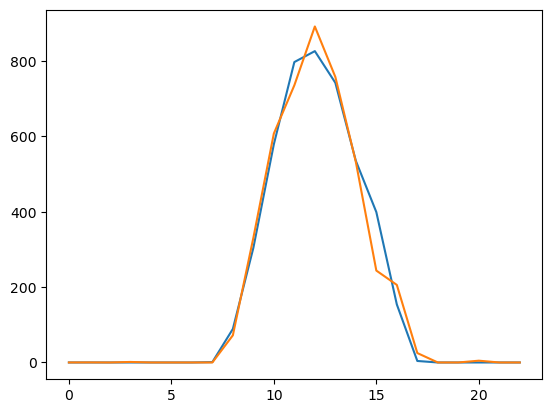

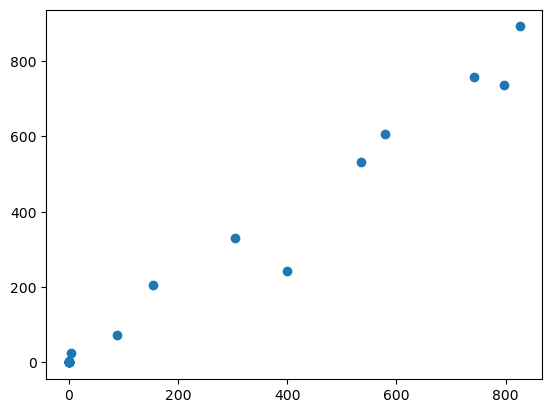

In [289]:
plt.plot(y_test[1:24])
plt.plot(y_pred_BT[1:24])
plt.show()
plt.scatter(y_test,y_pred_BT)

In [290]:
#Evaluate errors
MAE_BT=metrics.mean_absolute_error(y_test,y_pred_BT) 
MBE_BT=np.mean(y_test-y_pred_BT)
MSE_BT=metrics.mean_squared_error(y_test,y_pred_BT)  
RMSE_BT= np.sqrt(metrics.mean_squared_error(y_test,y_pred_BT))
cvRMSE_BT=RMSE_BT/np.mean(y_test)
NMBE_BT=MBE_BT/np.mean(y_test)
print(MAE_BT,MBE_BT,MSE_BT,RMSE_BT,cvRMSE_BT,NMBE_BT)

18.87445646945647 0.9172101972101953 1556.64008482744 39.45427840966604 0.21374778370925165 0.004969084589852074


In [291]:
#Temperature, Wind speed, Direct Radiation, Solar-1, Solar-2

In [292]:
Z = df_data.values
Y = Z[:,0]
#X = Z[:,[1,2,5,6,7,8,9,10,11]]
X=Z[:,[1,5,6,9,10]]

X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 24, shuffle = False)
print(X_train)
print(y_train)

[[12.2  5.6  0.   0.   0. ]
 [12.1  6.7  0.   0.   0. ]
 [11.5  6.1  0.   0.   0. ]
 ...
 [13.5  8.6  0.   0.   0. ]
 [12.4  6.4  0.   0.   0. ]
 [11.9  7.   0.   0.   0. ]]
[0. 0. 0. ... 0. 0. 0.]


In [293]:
BT_model = BaggingRegressor()
BT_model.fit(X_train, y_train)
y_pred_BT =BT_model.predict(X_test)

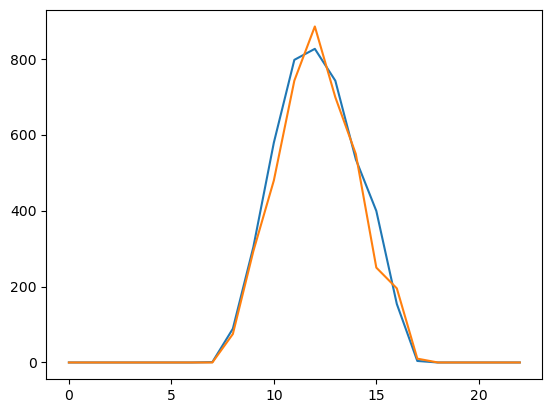

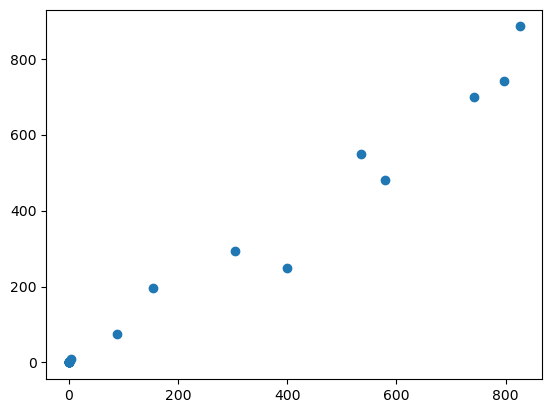

In [294]:
plt.plot(y_test[1:24])
plt.plot(y_pred_BT[1:24])
plt.show()
plt.scatter(y_test,y_pred_BT)

In [295]:
#Evaluate errors
MAE_BT=metrics.mean_absolute_error(y_test,y_pred_BT) 
MBE_BT=np.mean(y_test-y_pred_BT)
MSE_BT=metrics.mean_squared_error(y_test,y_pred_BT)  
RMSE_BT= np.sqrt(metrics.mean_squared_error(y_test,y_pred_BT))
cvRMSE_BT=RMSE_BT/np.mean(y_test)
NMBE_BT=MBE_BT/np.mean(y_test)
print(MAE_BT,MBE_BT,MSE_BT,RMSE_BT,cvRMSE_BT,NMBE_BT)

20.545833333333334 10.529166666666672 1782.8062500000003 42.22329037391568 0.22874920292866283 0.057042889390519214


In [296]:
#Solar-1,Solar -2, temperature, direct radiation e relative humidity

In [302]:
Z = df_data.values
Y = Z[:,0]
#X = Z[:,[1,2,5,6,7,8,9,10,11]]
X=Z[:,[1,2,6,9,10]]

X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size = 24, shuffle = False)
print(X_train)
print(y_train)

[[12.2 90.   0.   0.   0. ]
 [12.1 90.   0.   0.   0. ]
 [11.5 91.   0.   0.   0. ]
 ...
 [13.5 95.   0.   0.   0. ]
 [12.4 94.   0.   0.   0. ]
 [11.9 93.   0.   0.   0. ]]
[0. 0. 0. ... 0. 0. 0.]


In [303]:
BT_model = BaggingRegressor()
BT_model.fit(X_train, y_train)
y_pred_BT =BT_model.predict(X_test)

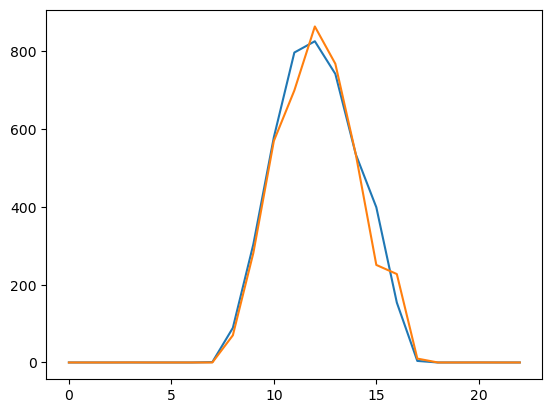

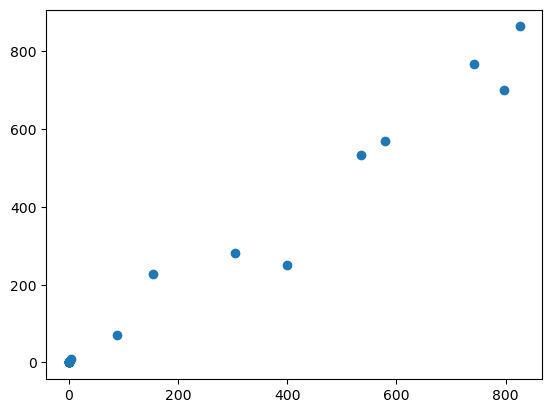

In [304]:
plt.plot(y_test[1:24])
plt.plot(y_pred_BT[1:24])
plt.show()
plt.scatter(y_test,y_pred_BT)

In [305]:
#Evaluate errors
MAE_BT=metrics.mean_absolute_error(y_test,y_pred_BT) 
MBE_BT=np.mean(y_test-y_pred_BT)
MSE_BT=metrics.mean_squared_error(y_test,y_pred_BT)  
RMSE_BT= np.sqrt(metrics.mean_squared_error(y_test,y_pred_BT))
cvRMSE_BT=RMSE_BT/np.mean(y_test)
NMBE_BT=MBE_BT/np.mean(y_test)
print(MAE_BT,MBE_BT,MSE_BT,RMSE_BT,cvRMSE_BT,NMBE_BT)

18.39375 6.406249999999999 1665.2238541666666 40.80715444829089 0.22107713470857365 0.034706546275395024


In order to have the best combination of features for different scenarios, such as less information available, we present several optimal combinations with different features. After several attempts, these were the best combinations:

The best set of 3 features: Relative Humidity (%), Solar Power-1h, Solar Power-2h
The best set of 4 features: Relative Humidity (%), Direct Radiation (W/m²), Solar Power-1h, Solar Power-2h
The best set of 5 features: Relative Humidity (%), Solar Power-1h, Solar Power-2h, Temperature, Direct Radiation (W/m²)

In [301]:
import pickle
#save RF model
with open('BT_model.pkl','wb') as file:
    pickle.dump(BT_model, file)